In [1]:
import glob
import os
import pickle
import random
import sys

import ivac
import matplotlib as mpl
import matplotlib.pyplot as plt
import mdtraj as md
import numpy as np
import prettypyplot as pplt
import pyemma
import scipy
import seaborn as sns
from matplotlib import ticker
from sklearn.cluster import MiniBatchKMeans
from sklearn.neighbors import NearestNeighbors

import pymbar
from pymbar import timeseries

Warning on use of the timeseries module: If the inherent timescales of the system are long compared to those being analyzed, this statistical inefficiency may be an underestimate.  The estimate presumes the use of many statistically independent samples.  Tests should be performed to assess whether this condition is satisfied.   Be cautious in the interpretation of the data.


In [2]:
import extq
import ivac

In [3]:
# upside_path = os.environ["UPSIDE_HOME"]
upside_path = "/project/dinner/scguo/upside2/"
upside_utils_dir = os.path.expanduser(upside_path + "/py")
sys.path.insert(0, upside_utils_dir)

In [4]:
plt.style.use("custom")  # custom style sheet
plt.style.use("vibrant")  # muted color theme from SciencePlots
pplt.load_cmaps()

In [5]:
plt.rcParams[
    "text.latex.preamble"
] = r"\usepackage{siunitx}\sisetup{detect-all}\usepackage{helvet}\usepackage{sansmath}\sansmath"
mpl.rcParams["font.family"] = "sans-serif"
mpl.rcParams["font.sans-serif"] = "cm"

In [6]:
%load_ext autoreload
%autoreload 1

# Starting in gs

## Load data

In [6]:
pdb_id = "gs_d91r"
start_frame = 2000  # skip first 2000 frames
work_dir = "/project/dinner/scguo/kaiB/remd/d91r_iso/gs"
n_rep = 48  # replica number
input_dir = f"{work_dir}/inputs"
result_dir = f"{work_dir}/outputs"

In [7]:
pot, hb, Ts, T, rgs = [], [], [], [], []
for i in range(n_rep):
    j = str(i).zfill(2)
    pot.append(np.load(f"{result_dir}/{pdb_id}.run.{j}_Energy.npy")[:, 0])
    hb.append(np.load(f"{result_dir}/{pdb_id}.run.{j}_Hbond.npy"))
    rgs.append(np.load(f"{result_dir}/{pdb_id}.run.{j}_Rg.npy"))
    t = np.load(f"{result_dir}/{pdb_id}.run.{j}_T.npy")
    nsize = pot[-1].size
    Ts.append(np.zeros(nsize) + t)
    T.append(t)

pot = np.array(pot)
hb = np.array(hb)
rgs = np.array(rgs)
Ts = np.array(Ts)
T = np.array(T)

print(pot.shape)

(48, 105322)


## weights using MBAR

In [64]:
kB = 1.0  # upside unit
beta = 1 / (kB * T)

raw_pot = pot[:, start_frame:]

nsamples = raw_pot.shape[-1]
nsamples_arr = np.zeros([n_rep], np.int32) + len(raw_pot[0])
reduced_pot = np.zeros([n_rep, n_rep, nsamples], np.float32)
for k in range(n_rep):
    for l in range(n_rep):
        reduced_pot[k, l] = beta[l] * raw_pot[k]

In [18]:
mbar = pymbar.MBAR(reduced_pot, nsamples_arr, verbose=True)

## Calculate melting curve using $R_g$ and hydrogen bonds

In [19]:
rg_mean = np.mean(rgs, axis=1)
hb_mean = np.mean(hb, axis=1)
rg_reweight = mbar.compute_expectations(rgs[:, start_frame:])
hb_reweight = mbar.compute_expectations(hb[:, start_frame:])

/beagle3/dinner/scguo/miniconda3/envs/py39/lib/python3.9/site-packages/pymbar/mbar.py:935: RuntimeWarning: divide by zero encountered in log
  Log_W_nk[:, sa] = np.log(A_n[i, ri]) + Log_W_nk[:, l]


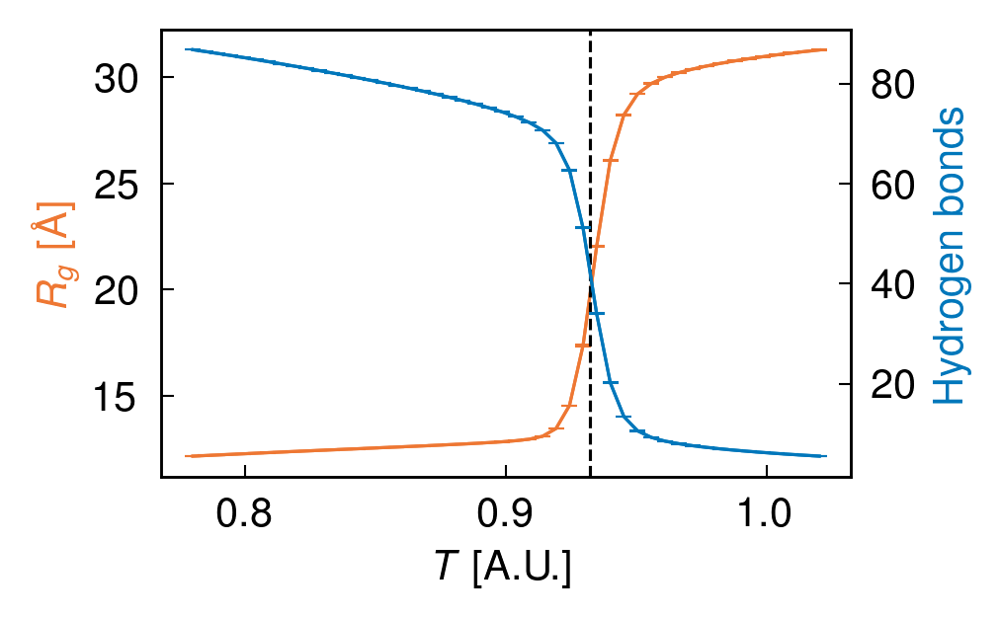

In [23]:
fig = plt.figure(figsize=(3, 2), dpi=300)
ax = plt.gca()
ax.plot(T, rg_reweight['mu'], color='C0')
ax.errorbar(T, rg_reweight['mu'], yerr=rg_reweight['sigma'], color='C0', capsize=2, capthick=0.5)
# ax.plot(T, rg_mean, color="C0", ls=":")
ax.set_ylabel("$R_g$ [Å]", color='C0')
ax2 = plt.twinx()
ax2.plot(T, hb_reweight['mu'], color='C1')
ax2.errorbar(T, hb_reweight['mu'], yerr=hb_reweight['sigma'], color='C1', capsize=2, capthick=0.5)
# ax2.plot(T, hb_mean, color="C1", ls=":")
ax2.set_ylabel("Hydrogen bonds", color='C1')
ax.set_xlabel("$T$ [A.U.]")
ax.axvline(0.932, zorder=5, ls='--', color='k')

In [66]:
print(T)

[0.77999997 0.78477168 0.78955799 0.79435879 0.79917413 0.80400407
 0.8088485  0.81370753 0.8185811  0.82346922 0.82837188 0.83328909
 0.83822083 0.84316719 0.84812802 0.85310346 0.85809344 0.86309797
 0.86811703 0.87315065 0.87819886 0.88326156 0.88833886 0.89343071
 0.8985371  0.90365803 0.90879351 0.91394353 0.91910809 0.92428726
 0.92948097 0.93468916 0.93991196 0.9451493  0.95040119 0.95566767
 0.96094865 0.96624422 0.97155428 0.97687894 0.98221815 0.9875719
 0.99294019 0.99832308 1.00372052 1.00913239 1.01455891 1.01999998]


In [72]:
beta_test

1.1494252873563218

In [56]:
# np.save(f"{result_dir}/log_weights.npy", np.reshape(w_nb, (48, -1)))
# w_nb = np.load(f"{result_dir}/log_weights.npy")

## Load CVs

In [77]:
head = "gs_."
raw_feats = np.load(f"{result_dir}/{head}_raw_feats.pkl", allow_pickle=True)
fs_qtots = np.load(f"{result_dir}/{head}_fs_qtots.pkl", allow_pickle=True)
f_rmsds = np.load(f"{result_dir}/{head}_f_rmsds.pkl", allow_pickle=True)
p_rmsds = np.load(f"{result_dir}/{head}_p_rmsds.pkl", allow_pickle=True)
r_rmsds = np.load(f"{result_dir}/{head}_r_rmsds.pkl", allow_pickle=True)

In [78]:
# Adam's CVs
c_gsa1 = np.concatenate([traj[1, :] for traj in fs_qtots])
c_gsa2 = np.concatenate([traj[3, :] for traj in fs_qtots])
c_gsb2 = np.concatenate([traj[5, :] for traj in fs_qtots])

c_fsb1 = np.concatenate([traj[0, :] for traj in fs_qtots])
c_fsb2 = np.concatenate([traj[2, :] for traj in fs_qtots])
c_fsa2 = np.concatenate([traj[4, :] for traj in fs_qtots])

c_green_arr = c_gsa2 - c_fsb2
c_blue_arr = c_gsb2 - c_fsa2
c_orange_arr = c_gsa1 - c_fsb1

c_green = [traj[3, :] - traj[2, :] for traj in fs_qtots]
c_blue = [traj[5, :] - traj[4, :] for traj in fs_qtots]
c_orange = [traj[1, :] - traj[0, :] for traj in fs_qtots]

In [82]:
def reweight(T_test):
    T_test = 0.87
    beta_test = 1 / (kB * T_test)
    log_w_nb = mbar._computeUnnormalizedLogWeights(np.ravel(beta_test * raw_pot)) # compute free energy with no bias
    max_log_w_nb = np.max(log_w_nb)  # to prevent underflow.
    w_nb = np.exp(log_w_nb - max_log_w_nb)
    return np.reshape(w_nb, (mbar.K, -1))

/scratch/local/jobs/6789601/ipykernel_1239125/636452459.py:14: RuntimeWarning: divide by zero encountered in log
  offset = np.min(-np.log(hist))
/scratch/local/jobs/6789601/ipykernel_1239125/636452459.py:15: RuntimeWarning: divide by zero encountered in log
  pmf = -np.log(hist) - offset


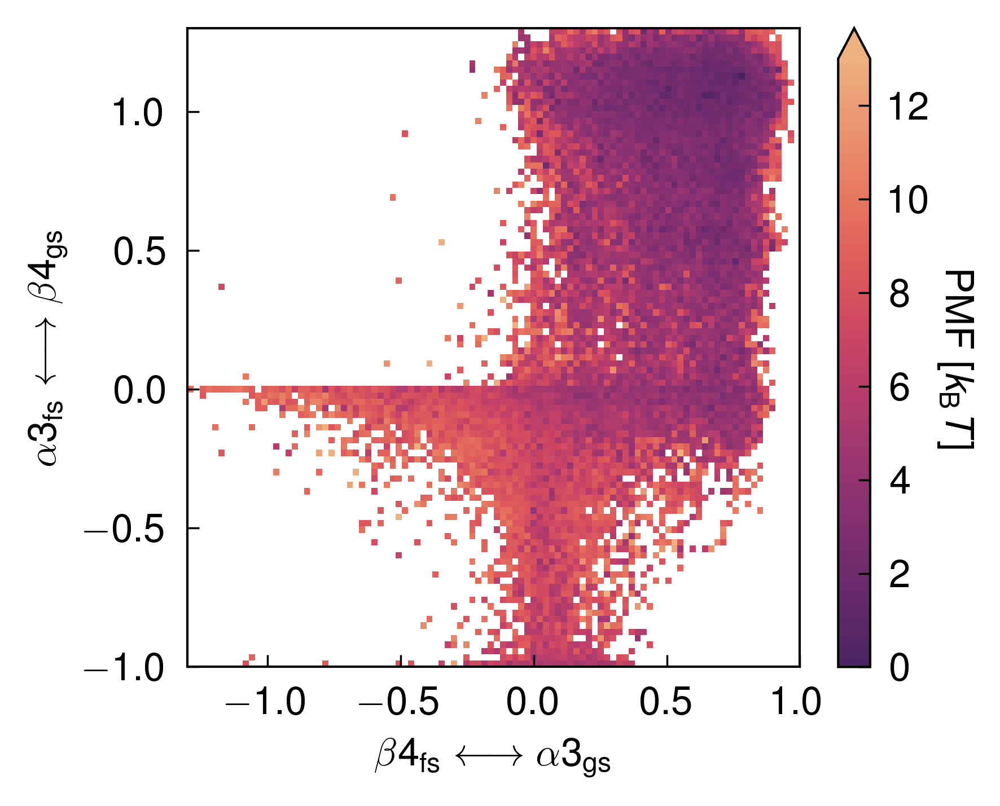

In [88]:
fig, ax = plt.subplots(figsize=(3.5, 3), dpi=500)

xe = np.linspace(-1.3, 1, 101)
ye = np.linspace(-1, 1.3, 101)
xc = (xe[1:] + xe[:-1]) / 2
yc = (ye[1:] + ye[:-1]) / 2
clines = np.arange(0, 13, 2)

cv1_delay = [t[start_frame:] for t in c_green]
cv2_delay = [t[start_frame:] for t in c_blue]

w_nb = reweight(0.87)
hist = extq.projection.density2d(cv1_delay, cv2_delay, w_nb, xe, ye)
offset = np.min(-np.log(hist))
pmf = -np.log(hist) - offset
pc = ax.pcolormesh(xc, yc, pmf.T / 50, vmax=13, cmap="flare_r", rasterized=True)
# ax.contour(xc, yc, pmf.T / 50, colors="white", levels=clines, linewidths=0.5)
ax.set_ylabel(r"$\alpha3_{\mathrm{fs}}\longleftrightarrow \beta4_{\mathrm{gs}}$")
ax.set_xlabel(r"$\beta4_{\mathrm{fs}}\longleftrightarrow\alpha3_{\mathrm{gs}}$")
# ax.set_title(f"$\\tau$ = {lagtime}")
ax.label_outer()
cb = plt.colorbar(pc, ax=ax, extend="max")
cb.set_label(r"PMF [$k_{\mathrm{B}}T$]", rotation=-90, labelpad=10)

/scratch/local/jobs/6789601/ipykernel_1239125/804435529.py:14: RuntimeWarning: divide by zero encountered in log
  offset = np.min(-np.log(hist))
/scratch/local/jobs/6789601/ipykernel_1239125/804435529.py:15: RuntimeWarning: divide by zero encountered in log
  pmf = -np.log(hist) - offset


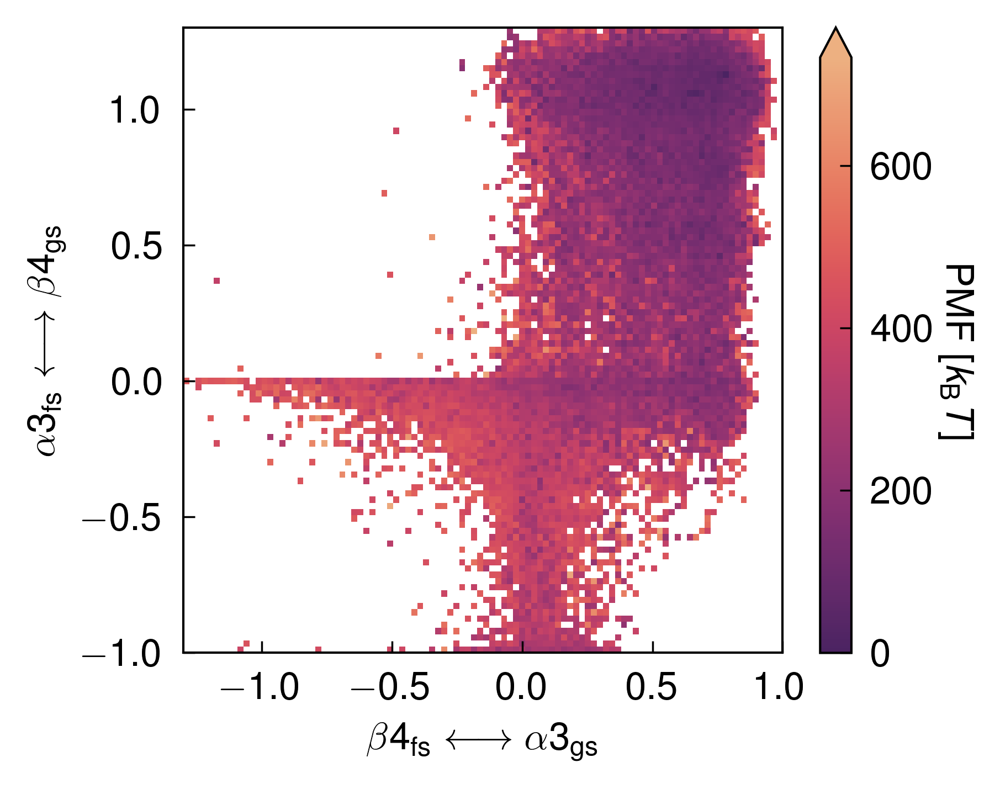

In [84]:
fig, ax = plt.subplots(figsize=(3.5, 3), dpi=500)

xe = np.linspace(-1.3, 1, 101)
ye = np.linspace(-1, 1.3, 101)
xc = (xe[1:] + xe[:-1]) / 2
yc = (ye[1:] + ye[:-1]) / 2
# clines = np.arange(0, 13, 2)

cv1_delay = [t[start_frame:] for t in c_green]
cv2_delay = [t[start_frame:] for t in c_blue]

w_nb = reweight(0.91)
hist = extq.projection.density2d(cv1_delay, cv2_delay, w_nb, xe, ye)
offset = np.min(-np.log(hist))
pmf = -np.log(hist) - offset
pc = ax.pcolormesh(xc, yc, pmf.T, cmap="flare_r", rasterized=True)
# ax.contour(xc, yc, pmf.T, colors="white", levels=clines, linewidths=0.5)
ax.set_ylabel(r"$\alpha3_{\mathrm{fs}}\longleftrightarrow \beta4_{\mathrm{gs}}$")
ax.set_xlabel(r"$\beta4_{\mathrm{fs}}\longleftrightarrow\alpha3_{\mathrm{gs}}$")
# ax.set_title(f"$\\tau$ = {lagtime}")
ax.label_outer()
cb = plt.colorbar(pc, ax=ax, extend="max")
cb.set_label(r"PMF [$k_{\mathrm{B}}T$]", rotation=-90, labelpad=10)

# Starting in fs

## Load data

In [89]:
pdb_id = "fs_d91r"
start_frame = 2000  # skip first 2000 frames
work_dir = "/project/dinner/scguo/kaiB/remd/d91r_iso/fs"
n_rep = 48  # replica number
input_dir = f"{work_dir}/inputs"
result_dir = f"{work_dir}/outputs"

In [90]:
pot, hb, Ts, T, rgs = [], [], [], [], []
for i in range(n_rep):
    j = str(i).zfill(2)
    pot.append(np.load(f"{result_dir}/{pdb_id}.run.{j}_Energy.npy")[:, 0])
    hb.append(np.load(f"{result_dir}/{pdb_id}.run.{j}_Hbond.npy"))
    rgs.append(np.load(f"{result_dir}/{pdb_id}.run.{j}_Rg.npy"))
    t = np.load(f"{result_dir}/{pdb_id}.run.{j}_T.npy")
    nsize = pot[-1].size
    Ts.append(np.zeros(nsize) + t)
    T.append(t)

pot = np.array(pot)
hb = np.array(hb)
rgs = np.array(rgs)
Ts = np.array(Ts)
T = np.array(T)

print(pot.shape)

(48, 19999)


## weights using MBAR

In [91]:
kB = 1.0  # upside unit
beta = 1 / (kB * T)

raw_pot = pot[:, start_frame:]

nsamples = raw_pot.shape[-1]
nsamples_arr = np.zeros([n_rep], np.int32) + len(raw_pot[0])
reduced_pot = np.zeros([n_rep, n_rep, nsamples], np.float32)
for k in range(n_rep):
    for l in range(n_rep):
        reduced_pot[k, l] = beta[l] * raw_pot[k]

In [92]:
mbar = pymbar.MBAR(reduced_pot, nsamples_arr, verbose=True)

## Calculate melting curve using $R_g$ and hydrogen bonds

In [93]:
rg_reweight = mbar.compute_expectations(rgs[:, start_frame:])
hb_reweight = mbar.compute_expectations(hb[:, start_frame:])

/beagle3/dinner/scguo/miniconda3/envs/py39/lib/python3.9/site-packages/pymbar/mbar.py:935: RuntimeWarning: divide by zero encountered in log
  Log_W_nk[:, sa] = np.log(A_n[i, ri]) + Log_W_nk[:, l]


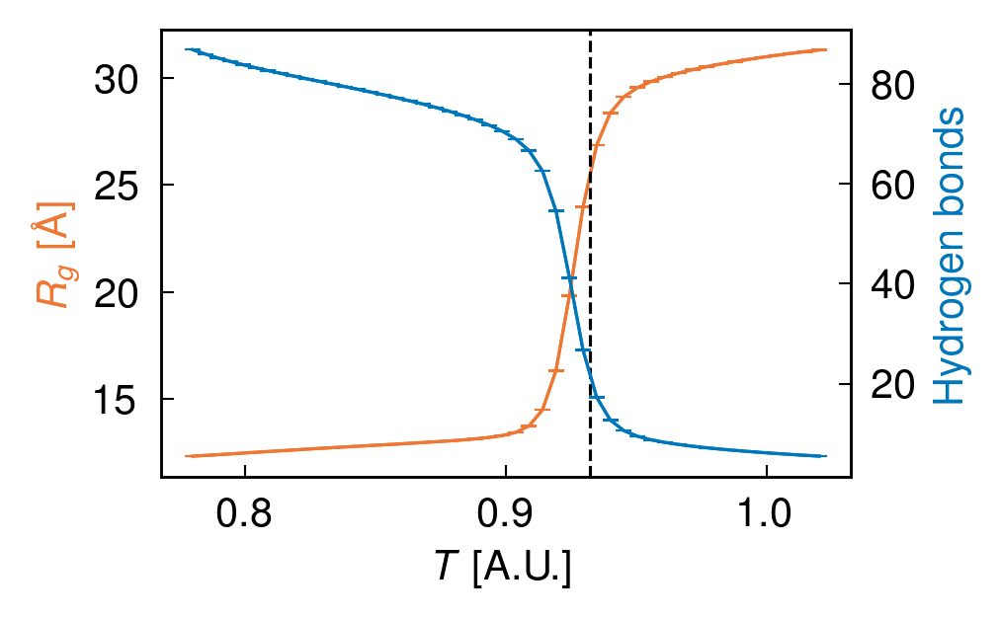

In [94]:
fig = plt.figure(figsize=(3, 2), dpi=300)
ax = plt.gca()
ax.plot(T, rg_reweight['mu'], color='C0')
ax.errorbar(T, rg_reweight['mu'], yerr=rg_reweight['sigma'], color='C0', capsize=2, capthick=0.5)
ax.set_ylabel("$R_g$ [Å]", color='C0')
ax2 = plt.twinx()
ax2.plot(T, hb_reweight['mu'], color='C1')
ax2.errorbar(T, hb_reweight['mu'], yerr=hb_reweight['sigma'], color='C1', capsize=2, capthick=0.5)
ax2.set_ylabel("Hydrogen bonds", color='C1')
ax.set_xlabel("$T$ [A.U.]")
ax.axvline(0.932, zorder=5, ls='--', color='k')

In [27]:
# np.save(f"{result_dir}/log_weights.npy", np.reshape(w_nb, (48, -1)))

## Load CVs

In [96]:
head = "fs_."
raw_feats = np.load(f"{result_dir}/{head}_raw_feats.pkl", allow_pickle=True)
fs_qtots = np.load(f"{result_dir}/{head}_fs_qtots.pkl", allow_pickle=True)
f_rmsds = np.load(f"{result_dir}/{head}_f_rmsds.pkl", allow_pickle=True)
p_rmsds = np.load(f"{result_dir}/{head}_p_rmsds.pkl", allow_pickle=True)
r_rmsds = np.load(f"{result_dir}/{head}_r_rmsds.pkl", allow_pickle=True)

In [97]:
# Adam's CVs
c_gsa1 = np.concatenate([traj[1, :] for traj in fs_qtots])
c_gsa2 = np.concatenate([traj[3, :] for traj in fs_qtots])
c_gsb2 = np.concatenate([traj[5, :] for traj in fs_qtots])

c_fsb1 = np.concatenate([traj[0, :] for traj in fs_qtots])
c_fsb2 = np.concatenate([traj[2, :] for traj in fs_qtots])
c_fsa2 = np.concatenate([traj[4, :] for traj in fs_qtots])

c_green_arr = c_gsa2 - c_fsb2
c_blue_arr = c_gsb2 - c_fsa2
c_orange_arr = c_gsa1 - c_fsb1

c_green = [traj[3, :] - traj[2, :] for traj in fs_qtots]
c_blue = [traj[5, :] - traj[4, :] for traj in fs_qtots]
c_orange = [traj[1, :] - traj[0, :] for traj in fs_qtots]

/scratch/local/jobs/6789601/ipykernel_1239125/2015746908.py:14: RuntimeWarning: divide by zero encountered in log
  offset = np.min(-np.log(hist))
/scratch/local/jobs/6789601/ipykernel_1239125/2015746908.py:15: RuntimeWarning: divide by zero encountered in log
  pmf = -np.log(hist) - offset


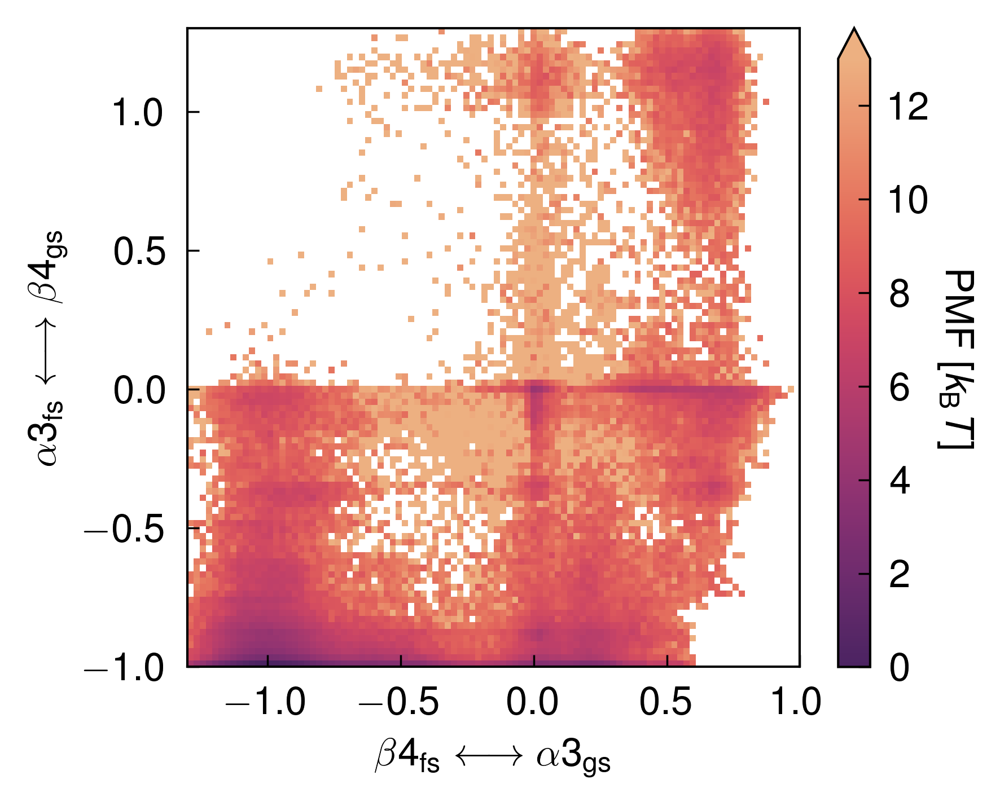

In [99]:
fig, ax = plt.subplots(figsize=(3.5, 3), dpi=500)

xe = np.linspace(-1.3, 1, 101)
ye = np.linspace(-1, 1.3, 101)
xc = (xe[1:] + xe[:-1]) / 2
yc = (ye[1:] + ye[:-1]) / 2
clines = np.arange(0, 13, 2)

cv1_delay = [t[start_frame:] for t in c_green]
cv2_delay = [t[start_frame:] for t in c_blue]

w_nb = reweight(0.87)
hist = extq.projection.density2d(cv1_delay, cv2_delay, w_nb, xe, ye)
offset = np.min(-np.log(hist))
pmf = -np.log(hist) - offset
pc = ax.pcolormesh(xc, yc, pmf.T, vmax=13, cmap="flare_r", rasterized=True)
# ax.contour(xc, yc, pmf.T / 50, colors="white", levels=clines, linewidths=0.5)
ax.set_ylabel(r"$\alpha3_{\mathrm{fs}}\longleftrightarrow \beta4_{\mathrm{gs}}$")
ax.set_xlabel(r"$\beta4_{\mathrm{fs}}\longleftrightarrow\alpha3_{\mathrm{gs}}$")
# ax.set_title(f"$\\tau$ = {lagtime}")
ax.label_outer()
cb = plt.colorbar(pc, ax=ax, extend="max")
cb.set_label(r"PMF [$k_{\mathrm{B}}T$]", rotation=-90, labelpad=10)

/scratch/local/jobs/6789601/ipykernel_1239125/3866943654.py:14: RuntimeWarning: divide by zero encountered in log
  offset = np.min(-np.log(hist))
/scratch/local/jobs/6789601/ipykernel_1239125/3866943654.py:15: RuntimeWarning: divide by zero encountered in log
  pmf = -np.log(hist) - offset


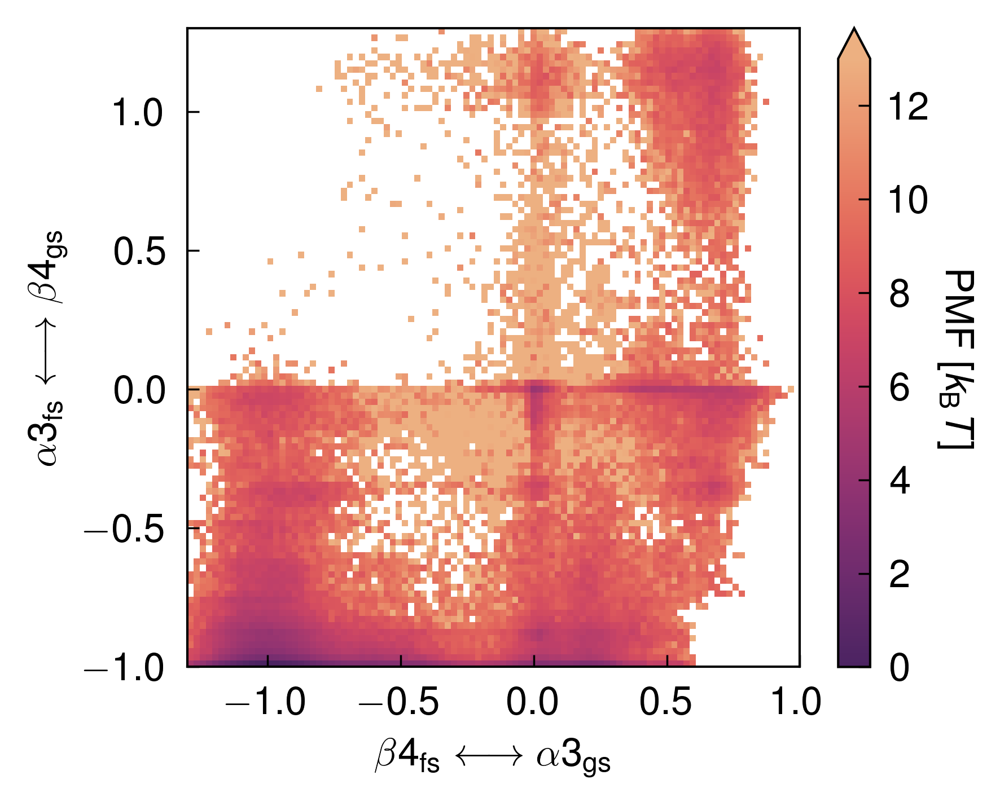

In [103]:
fig, ax = plt.subplots(figsize=(3.5, 3), dpi=500)

xe = np.linspace(-1.3, 1, 101)
ye = np.linspace(-1, 1.3, 101)
xc = (xe[1:] + xe[:-1]) / 2
yc = (ye[1:] + ye[:-1]) / 2
clines = np.arange(0, 13, 2)

cv1_delay = [t[start_frame:] for t in c_green]
cv2_delay = [t[start_frame:] for t in c_blue]

w_nb = reweight(0.91)
hist = extq.projection.density2d(cv1_delay, cv2_delay, w_nb, xe, ye)
offset = np.min(-np.log(hist))
pmf = -np.log(hist) - offset
pc = ax.pcolormesh(xc, yc, pmf.T, vmax=13, cmap="flare_r", rasterized=True)
# ax.contour(xc, yc, pmf.T, colors="white", levels=clines, linewidths=0.5)
ax.set_ylabel(r"$\alpha3_{\mathrm{fs}}\longleftrightarrow \beta4_{\mathrm{gs}}$")
ax.set_xlabel(r"$\beta4_{\mathrm{fs}}\longleftrightarrow\alpha3_{\mathrm{gs}}$")
# ax.set_title(f"$\\tau$ = {lagtime}")
ax.label_outer()
cb = plt.colorbar(pc, ax=ax, extend="max")
cb.set_label(r"PMF [$k_{\mathrm{B}}T$]", rotation=-90, labelpad=10)

# Combine two datasets

## Load data

In [7]:
n_rep = 48  # replica number
start_frame = 2000  # skip first 2000 frames

pdb_gs = "gs_d91r"
work_dir_gs = "/project/dinner/scguo/kaiB/remd/d91r_iso/gs"
input_dir_gs = f"{work_dir_gs}/inputs"
result_dir_gs = f"{work_dir_gs}/outputs"

pdb_fs = "fs_d91r"
work_dir_fs = "/project/dinner/scguo/kaiB/remd/d91r_iso/fs"
input_dir_fs = f"{work_dir_fs}/inputs"
result_dir_fs = f"{work_dir_fs}/outputs"

In [8]:
pot, hb, Ts, T, rgs = [], [], [], [], []
for i in range(n_rep):
    j = str(i).zfill(2)
    pot_gs = np.load(f"{result_dir_gs}/{pdb_gs}.run.{j}_Energy.npy")[:, 0]
    pot_fs = np.load(f"{result_dir_fs}/{pdb_fs}.run.{j}_Energy.npy")[:, 0]
    pot.append(np.concatenate((pot_gs[start_frame:], pot_fs[start_frame:])))
    
    hb_gs = np.load(f"{result_dir_gs}/{pdb_gs}.run.{j}_Hbond.npy")
    hb_fs = np.load(f"{result_dir_fs}/{pdb_fs}.run.{j}_Hbond.npy")
    hb.append(np.concatenate((hb_gs[start_frame:], hb_fs[start_frame:])))
    
    rgs_gs = np.load(f"{result_dir_gs}/{pdb_gs}.run.{j}_Rg.npy")
    rgs_fs = np.load(f"{result_dir_fs}/{pdb_fs}.run.{j}_Rg.npy")
    rgs.append(np.concatenate((rgs_gs[start_frame:], rgs_fs[start_frame:])))
    
    t = np.load(f"{result_dir_gs}/{pdb_gs}.run.{j}_T.npy")
    nsize = pot[-1].size
    Ts.append(np.zeros(nsize) + t)
    T.append(t)
    
pot = np.array(pot)
hb = np.array(hb)
rgs = np.array(rgs)
Ts = np.array(Ts)
T = np.array(T)

print(pot.shape)

(48, 206479)


## weights using MBAR

In [9]:
kB = 1.0  # upside unit
beta = 1 / (kB * T)

raw_pot = pot

nsamples = raw_pot.shape[-1]
nsamples_arr = np.zeros([n_rep], np.int32) + len(raw_pot[0])
reduced_pot = np.zeros([n_rep, n_rep, nsamples], np.float32)
for k in range(n_rep):
    for l in range(n_rep):
        reduced_pot[k, l] = beta[l] * raw_pot[k]

In [10]:
reduced_pot.shape

(48, 48, 206479)

In [11]:
mbar = pymbar.MBAR(reduced_pot, nsamples_arr, verbose=True)

## Calculate melting curve using $R_g$ and hydrogen bonds

In [12]:
rg_reweight = mbar.compute_expectations(rgs)
hb_reweight = mbar.compute_expectations(hb)

/beagle3/dinner/scguo/miniconda3/envs/py39/lib/python3.9/site-packages/pymbar/mbar.py:935: RuntimeWarning: divide by zero encountered in log
  Log_W_nk[:, sa] = np.log(A_n[i, ri]) + Log_W_nk[:, l]


/project/dinner/scguo/prettypyplot/src/prettypyplot/pyplot.py:241: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  leg = ax.legend(handles, labels, *args, **kwargs)


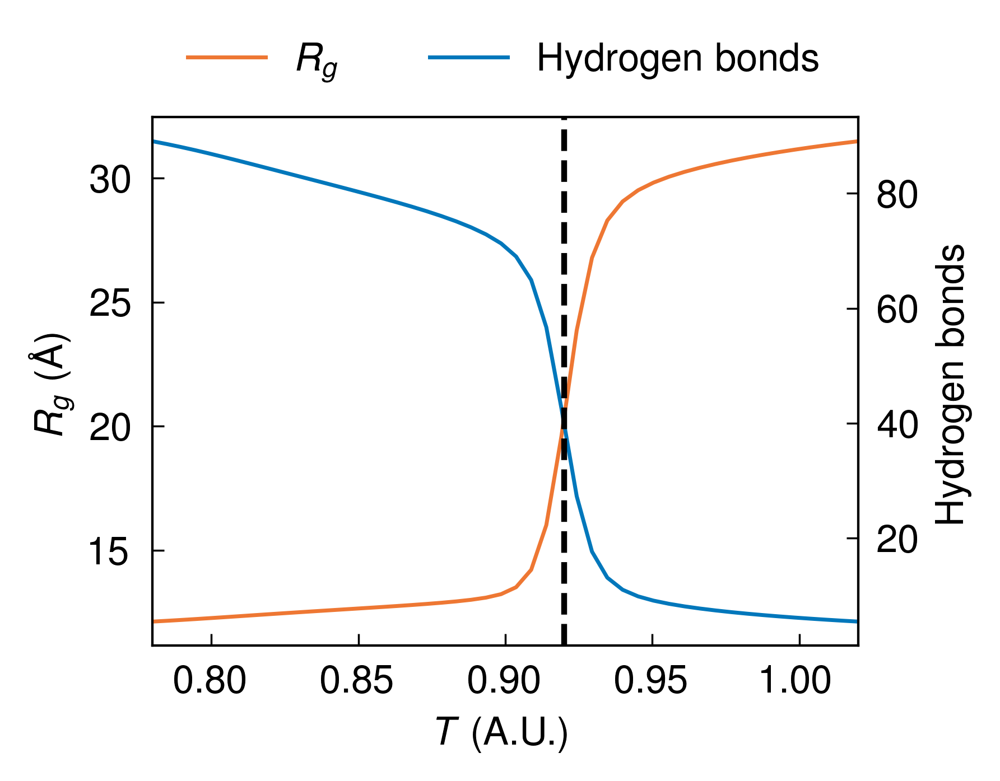

In [33]:
fig = plt.figure(figsize=(3.25, 2.5), dpi=500)
ax = plt.gca()
line1, = ax.plot(T, rg_reweight['mu'], color='C0', label="$R_g$", lw=1.0)
# ax.errorbar(T, rg_reweight['mu'], yerr=rg_reweight['sigma'], color='C0', capsize=2, capthick=0.5)
ax.set_ylabel("$R_g$ (Å)")
ax2 = plt.twinx()
line2, = ax2.plot(T, hb_reweight['mu'], color='C1', label="Hydrogen bonds", lw=1.0)
# ax2.errorbar(T, hb_reweight['mu'], yerr=hb_reweight['sigma'], color='C1', capsize=2, capthick=0.5)
ax2.set_ylabel("Hydrogen bonds")
ax.set_xlabel("$T$ (A.U.)")
ax2.axvline(0.92, ls='--', color='k', lw=1.5, zorder=5)
ax.set_xlim([T[0], T[-1]])

pplt.legend(outside='top', ncol=2, handles=[line1, line2])
plt.savefig("../../dga/figures/remd_dga_tmelt.png", bbox_inches='tight')

## Load CVs

In [15]:
head = "remd_."
raw_feats = list(np.load(f"{result_dir_gs}/{head}_raw_feats.pkl", allow_pickle=True))

In [16]:
def load_cvs():
    head = "remd_."
    raw_feats_gs = list(np.load(f"{result_dir_gs}/{head}_raw_feats.pkl", allow_pickle=True))
    fs_qtots_gs = list(np.load(f"{result_dir_gs}/{head}_fs_qtots.pkl", allow_pickle=True))
    f_rmsds_gs = list(np.load(f"{result_dir_gs}/{head}_f_rmsds.pkl", allow_pickle=True))
    p_rmsds_gs = list(np.load(f"{result_dir_gs}/{head}_p_rmsds.pkl", allow_pickle=True))
    r_rmsds_gs = list(np.load(f"{result_dir_gs}/{head}_r_rmsds.pkl", allow_pickle=True))

    head = "remd_."
    raw_feats_fs = list(np.load(f"{result_dir_fs}/{head}_raw_feats.pkl", allow_pickle=True))
    fs_qtots_fs = list(np.load(f"{result_dir_fs}/{head}_fs_qtots.pkl", allow_pickle=True))
    f_rmsds_fs = list(np.load(f"{result_dir_fs}/{head}_f_rmsds.pkl", allow_pickle=True))
    p_rmsds_fs = list(np.load(f"{result_dir_fs}/{head}_p_rmsds.pkl", allow_pickle=True))
    r_rmsds_fs = list(np.load(f"{result_dir_fs}/{head}_r_rmsds.pkl", allow_pickle=True))

    # raw_feats = np.concatenate((raw_feats_gs[:, start_frame:], raw_feats_fs[:, start_frame:]), axis=1)
    # fs_qtots = np.concatenate((fs_qtots_gs[:, :, start_frame:], fs_qtots_fs[:, :, start_frame:]), axis=2)
    # f_rmsds = np.concatenate((f_rmsds_gs[:, start_frame:], f_rmsds_fs[:, start_frame:]), axis=1)
    # p_rmsds = np.concatenate((p_rmsds_gs[:, start_frame:], p_rmsds_fs[:, start_frame:]), axis=1)
    # r_rmsds = np.concatenate((r_rmsds_gs[:, start_frame:], r_rmsds_fs[:, start_frame:]), axis=1)
    raw_feats_gs = [traj[start_frame:] for traj in raw_feats_gs]
    raw_feats_fs = [traj[start_frame:] for traj in raw_feats_fs]
    raw_feats_gs.extend(raw_feats_fs)
    
    fs_qtots_gs = [traj[:, start_frame:] for traj in fs_qtots_gs]
    fs_qtots_fs = [traj[:, start_frame:] for traj in fs_qtots_fs]
    fs_qtots_gs.extend(fs_qtots_fs)
    
    f_rmsds_gs = [traj[start_frame:] for traj in f_rmsds_gs]
    f_rmsds_fs = [traj[start_frame:] for traj in f_rmsds_fs]
    f_rmsds_gs.extend(f_rmsds_fs)
    
    p_rmsds_gs = [traj[start_frame:] for traj in p_rmsds_gs]
    p_rmsds_fs = [traj[start_frame:] for traj in p_rmsds_fs]
    p_rmsds_gs.extend(p_rmsds_fs)
    
    r_rmsds_gs = [traj[start_frame:] for traj in r_rmsds_gs]
    r_rmsds_fs = [traj[start_frame:] for traj in r_rmsds_fs]
    r_rmsds_gs.extend(r_rmsds_fs)
    
    return raw_feats_gs, fs_qtots_gs, f_rmsds_gs, p_rmsds_gs, r_rmsds_gs

In [17]:
raw_feats, fs_qtots, f_rmsds, p_rmsds, r_rmsds = load_cvs()

In [18]:
# Adam's CVs
c_gsa1 = np.concatenate([traj[1, :] for traj in fs_qtots])
c_gsa2 = np.concatenate([traj[3, :] for traj in fs_qtots])
c_gsb2 = np.concatenate([traj[5, :] for traj in fs_qtots])

c_fsb1 = np.concatenate([traj[0, :] for traj in fs_qtots])
c_fsb2 = np.concatenate([traj[2, :] for traj in fs_qtots])
c_fsa2 = np.concatenate([traj[4, :] for traj in fs_qtots])

c_green_arr = c_gsa2 - c_fsb2
c_blue_arr = c_gsb2 - c_fsa2
c_orange_arr = c_gsa1 - c_fsb1

c_green = [traj[3, :] - traj[2, :] for traj in fs_qtots]
c_blue = [traj[5, :] - traj[4, :] for traj in fs_qtots]
c_orange = [traj[1, :] - traj[0, :] for traj in fs_qtots]

In [19]:
def reweight(T_test):
    beta_test = 1 / (kB * T_test)
    log_w_nb = mbar._computeUnnormalizedLogWeights(np.ravel(beta_test * raw_pot)) # compute free energy with no bias
    max_log_w_nb = np.max(log_w_nb)  # to prevent underflow.
    w_nb = np.exp(log_w_nb - max_log_w_nb)
    return w_nb

In [ ]:
with open(f"{base

In [20]:
def split_indices(arrays):
    """Gets the indices for np.split from a
    list of arrays.

    Parameters
    ----------
    arrays : ndarray or list/tuple of ndarray
        Arrays from which to get indices

    Returns
    -------
    traj_inds : list of int
        Frame separators to use in np.split
    """
    traj_lens = [len(traj) for traj in arrays]
    traj_inds = []
    subtot = 0
    for length in traj_lens[:-1]:
        subtot += length
        traj_inds.append(subtot)
    return traj_inds

In [21]:
traj_inds = split_indices(c_green)

/scratch/local/jobs/7298669/ipykernel_3839408/2410030246.py:14: RuntimeWarning: divide by zero encountered in log
  offset = np.min(-np.log(hist))
/scratch/local/jobs/7298669/ipykernel_3839408/2410030246.py:15: RuntimeWarning: divide by zero encountered in log
  pmf = -np.log(hist) - offset


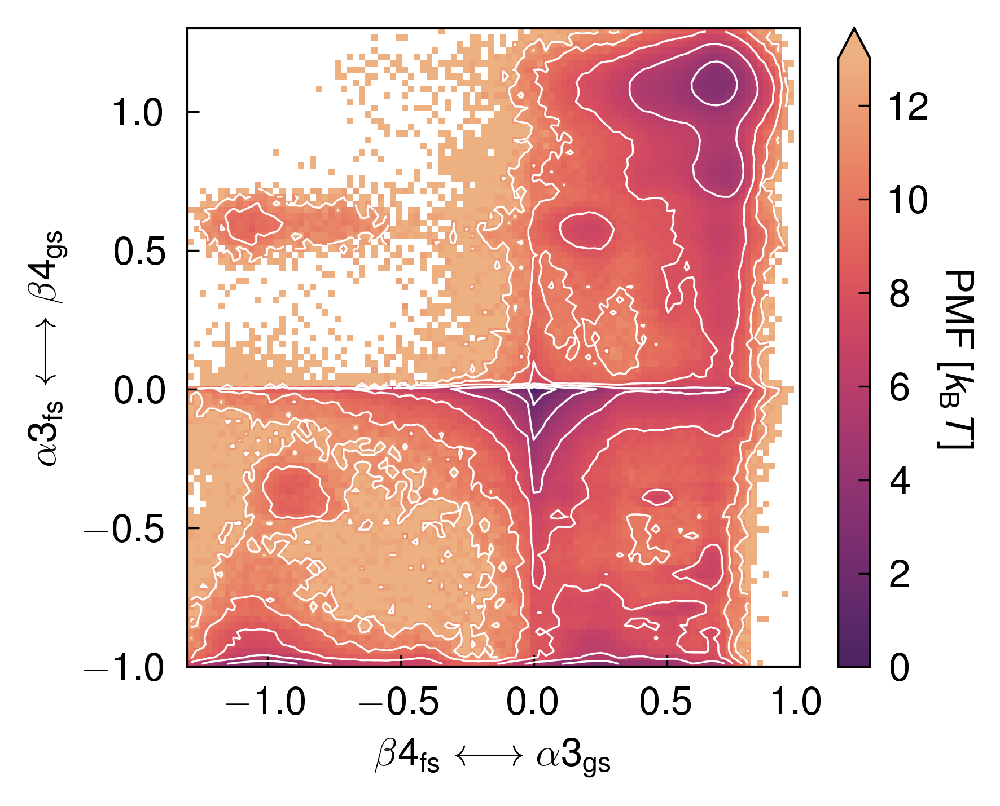

In [39]:
fig, ax = plt.subplots(figsize=(3.5, 3), dpi=500)

xe = np.linspace(-1.3, 1, 101)
ye = np.linspace(-1, 1.3, 101)
xc = (xe[1:] + xe[:-1]) / 2
yc = (ye[1:] + ye[:-1]) / 2
clines = np.arange(0, 13, 2)

cv1_delay = [t for t in c_green]
cv2_delay = [t for t in c_blue]

w_nb = np.split(reweight(0.87), traj_inds)
hist = extq.projection.density2d(cv1_delay, cv2_delay, w_nb, xe, ye)
offset = np.min(-np.log(hist))
pmf = -np.log(hist) - offset
pc = ax.pcolormesh(xc, yc, pmf.T, vmax=13, cmap="flare_r", rasterized=True)
ax.contour(xc, yc, pmf.T, colors="white", levels=clines, linewidths=0.5)
ax.set_ylabel(r"$\alpha3_{\mathrm{fs}}\longleftrightarrow \beta4_{\mathrm{gs}}$")
ax.set_xlabel(r"$\beta4_{\mathrm{fs}}\longleftrightarrow\alpha3_{\mathrm{gs}}$")
# ax.set_title(f"$\\tau$ = {lagtime}")
ax.label_outer()
cb = plt.colorbar(pc, ax=ax, extend="max")
cb.set_label(r"PMF [$k_{\mathrm{B}}T$]", rotation=-90, labelpad=10)

/scratch/local/jobs/7298669/ipykernel_3839408/1028097248.py:14: RuntimeWarning: divide by zero encountered in log
  offset = np.min(-np.log(hist))
/scratch/local/jobs/7298669/ipykernel_3839408/1028097248.py:15: RuntimeWarning: divide by zero encountered in log
  pmf = -np.log(hist) - offset


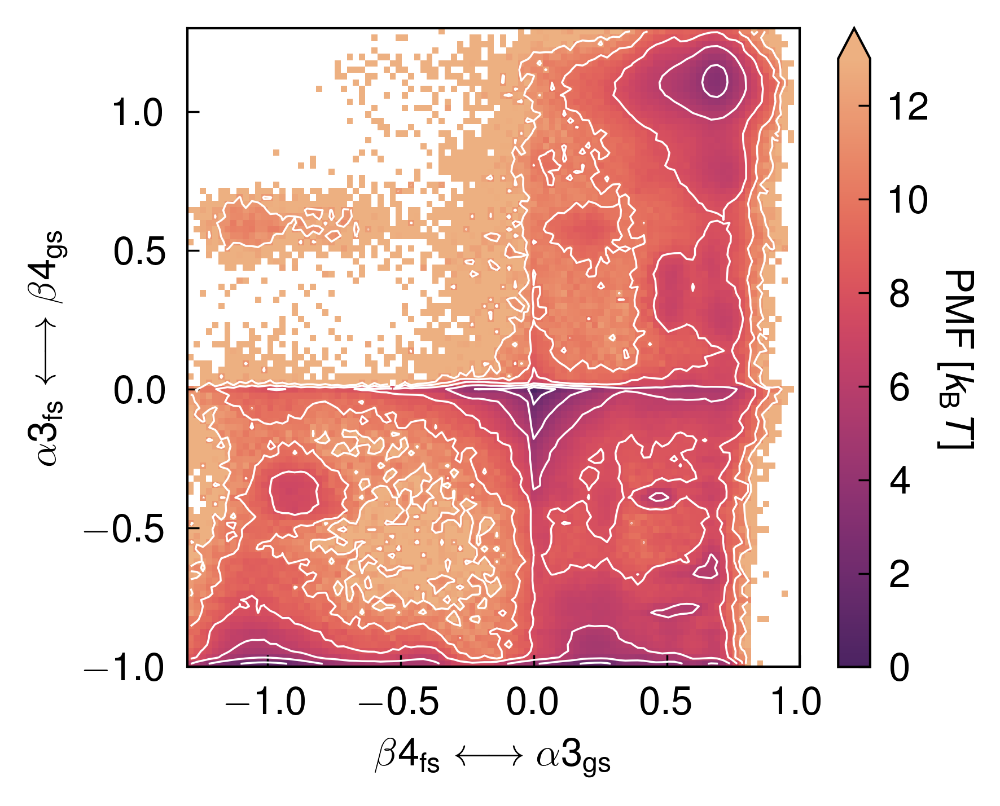

In [40]:
fig, ax = plt.subplots(figsize=(3.5, 3), dpi=500)

xe = np.linspace(-1.3, 1, 101)
ye = np.linspace(-1, 1.3, 101)
xc = (xe[1:] + xe[:-1]) / 2
yc = (ye[1:] + ye[:-1]) / 2
clines = np.arange(0, 13, 2)

cv1_delay = [t for t in c_green]
cv2_delay = [t for t in c_blue]

w_nb = np.split(reweight(0.91), traj_inds)
hist = extq.projection.density2d(cv1_delay, cv2_delay, w_nb, xe, ye)
offset = np.min(-np.log(hist))
pmf = -np.log(hist) - offset
pc = ax.pcolormesh(xc, yc, pmf.T, vmax=13, cmap="flare_r", rasterized=True)
ax.contour(xc, yc, pmf.T, colors="white", levels=clines, linewidths=0.5)
ax.set_ylabel(r"$\alpha3_{\mathrm{fs}}\longleftrightarrow \beta4_{\mathrm{gs}}$")
ax.set_xlabel(r"$\beta4_{\mathrm{fs}}\longleftrightarrow\alpha3_{\mathrm{gs}}$")
# ax.set_title(f"$\\tau$ = {lagtime}")
ax.label_outer()
cb = plt.colorbar(pc, ax=ax, extend="max")
cb.set_label(r"PMF [$k_{\mathrm{B}}T$]", rotation=-90, labelpad=10)

# Apply DGA to data

## Functions

In [22]:
def make_sparse_basis(dtrajs, k):
    """Converts a discretized trajectory (e.g. from k-means clustering)
    into a sparse basis of indicator functions.

    Parameters
    ----------
    dtrajs : ndarray
        discretized trajectories

    Return
    ------
    basis : scipy.sparse.csr_matrix
    """
    nclusters = k
    rows, cols = [], []
    for i in range(nclusters):
        pts = np.argwhere(dtrajs == i)
        # indices of which frames are in the cluster i
        rows.append(pts.squeeze())
        # all assigned as 1 in the basis
        cols.append(np.repeat(i, len(pts)))
    rows = np.hstack(rows)
    cols = np.hstack(cols)
    data = np.ones(len(rows), dtype=float)
    basis = scipy.sparse.csr_matrix((data, (rows, cols)), shape=(len(dtrajs), nclusters))
    return basis

In [23]:
def adjust_forward_committor(forward_q, in_domain, lag):
    result_qp = []
    for qp, d in zip(forward_q, in_domain):
        n = len(d)
        assert len(qp) == n
        tp = extq.stop.forward_stop(d)
        iy = np.minimum(np.arange(lag, n), tp[:-lag])
        result_qp.append(qp[iy])
    return result_qp

In [24]:
import dill

In [25]:
p_rmsd_arr = np.concatenate(p_rmsds)
f_rmsd_arr = np.concatenate(f_rmsds)
in_fs = np.logical_and(
    c_green_arr < -0.78,
    np.logical_and(c_blue_arr < -0.83, np.logical_and(c_orange_arr < -0.75, f_rmsd_arr < 0.35)),
)

in_gs = np.logical_and(
    c_green_arr > 0.67,
    np.logical_and(c_blue_arr > 0.88, np.logical_and(c_orange_arr > 0.75, p_rmsd_arr < 0.45)),
)

In [26]:
lags = np.array([100, 200, 500, 1000, 2000, 5000], dtype=int)
lagtimes = lags * 50

## T = 0.87

In [27]:
base_dir87 = "/project/dinner/scguo/kaiB/dga/87/dga_data"

In [28]:
# convert features to IVAC
with open(f"{base_dir87}/ivac.pkl", mode="rb+") as f:
    ivac = dill.load(f)

In [29]:
ivac_trajs = ivac.transform(raw_feats)

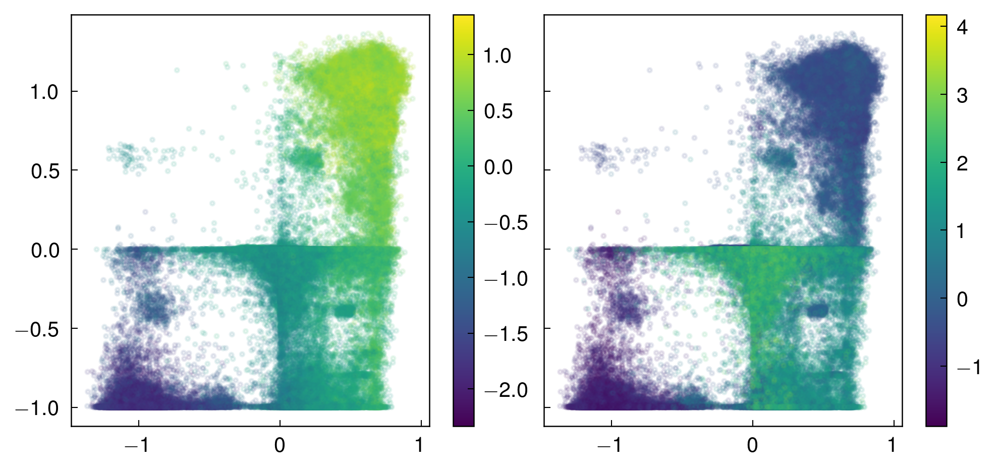

In [59]:
fig, axes = plt.subplots(1, 2, figsize=(6.5, 3), dpi=300, sharex=True, sharey=True, constrained_layout=True)
for i, ax in enumerate(axes):
    sc = ax.scatter(c_green_arr[::50], c_blue_arr[::50], c=np.concatenate(ivac_trajs)[::50, i + 1], alpha=0.1, marker="o")
    cb = plt.colorbar(sc, ax=ax)
    cb.solids.set(alpha=1.)

In [30]:
# assign data to clusters
with open(f"{base_dir87}/nneighbors.pkl", mode="rb+") as f:
    neighbors = dill.load(f)

In [31]:
dtraj = neighbors.kneighbors(np.concatenate(ivac_trajs), return_distance=False)

In [32]:
# split into lists of arrays
k = 300
basis_d_arr = make_sparse_basis(np.squeeze(dtraj), k)[:, :-1]
basis_d_arr[in_fs] = 0
basis_d_arr[in_gs] = 0

traj_lens = [len(traj) for traj in raw_feats]
basis_d = []
curr = 0
for t_len in traj_lens:
    basis_d.append(basis_d_arr[curr : curr + t_len])
    curr += t_len

traj_inds = split_indices(raw_feats)
guess_fs = np.split(in_fs.astype(float), traj_inds)
guess_gs = np.split(in_gs.astype(float), traj_inds)

print(len(basis_d), basis_d[0].shape)

/home/scguo/.local/lib/python3.9/site-packages/scipy/sparse/_index.py:146: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


96 (103322, 299)


In [33]:
coeffs = np.load(f"{base_dir87}/qp_fs2gs_coeffs.npy")
coeffs_gs2fs = np.load(f"{base_dir87}/qp_gs2fs_coeffs.npy")

In [34]:
qp_fs2gs, qp_gs2fs = [], []
for cf, cg in zip(coeffs, coeffs_gs2fs):
    qp_fs2gs.append([x @ cf + g for (x, g) in zip(basis_d, guess_gs)])
    qp_gs2fs.append([x @ cg + g for (x, g) in zip(basis_d, guess_fs)])

In [35]:
in_domain = ~(in_fs | in_gs)
in_d = np.split(in_domain, traj_inds)

/project/dinner/scguo/extq/src/extq/projection.py:140: RuntimeWarning: invalid value encountered in divide
  return numer / denom


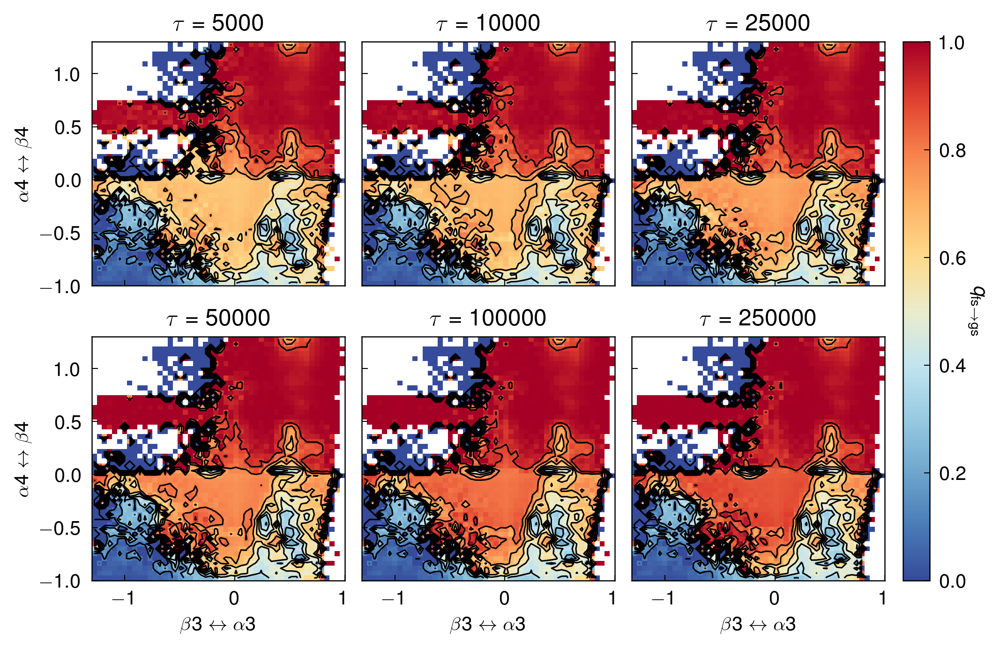

In [72]:
# plot against "GT" and "BT"
fig, axes = plt.subplots(
    nrows=2, ncols=3, figsize=(7, 4.5), dpi=300, sharex=True, sharey=True, constrained_layout=True
)

xe = np.linspace(-1.3, 1, 51)
ye = np.linspace(-1, 1.3, 51)
xc = (xe[1:] + xe[:-1]) / 2
yc = (ye[1:] + ye[:-1]) / 2
clines = np.linspace(0, 1, 11)

w_nb = np.split(reweight(0.87), traj_inds)
for ax, lag, lagtime, q in zip(axes.flat, lags, lagtimes, qp_fs2gs):
    w_delay = [t[:-lag] for t in w_nb]
    cv1_delay = [t[:-lag] for t in c_green]
    cv2_delay = [t[:-lag] for t in c_blue]
    qp_delay = adjust_forward_committor(q, in_d, lag)
    hist = extq.projection.average2d(cv1_delay, cv2_delay, qp_delay, w_delay, xe, ye)
    pc = ax.pcolormesh(xc, yc, hist.T, cmap="diverging")
    ax.contour(xc, yc, hist.T, colors="black", levels=clines)
    ax.set_ylabel(r"$\alpha4\leftrightarrow \beta4$")
    ax.set_xlabel(r"$\beta3\leftrightarrow\alpha3$")
    ax.set_title(f"$\\tau$ = {lagtime}")
    ax.label_outer()
cb = plt.colorbar(pc, ax=axes[:, -1])
cb.set_label(r"$q_{\mathrm{fs}\rightarrow\mathrm{gs}}$", rotation=-90, labelpad=10)

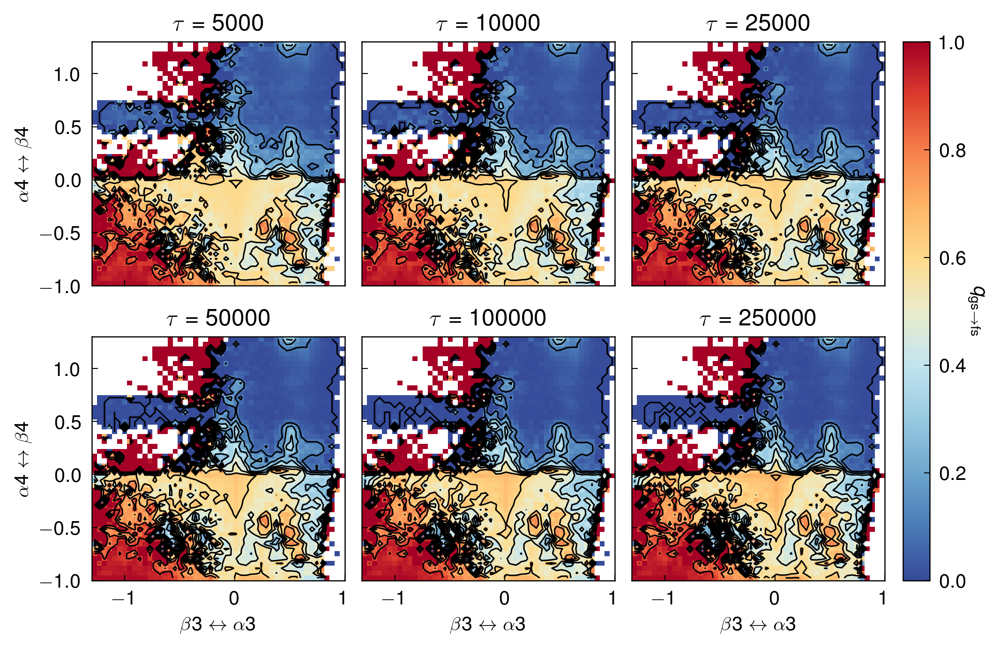

In [80]:
# plot against "GT" and "BT"
fig, axes = plt.subplots(
    nrows=2, ncols=3, figsize=(7, 4.5), dpi=300, sharex=True, sharey=True, constrained_layout=True
)

xe = np.linspace(-1.3, 1, 51)
ye = np.linspace(-1, 1.3, 51)
xc = (xe[1:] + xe[:-1]) / 2
yc = (ye[1:] + ye[:-1]) / 2
clines = np.linspace(0, 1, 11)

w_nb = np.split(reweight(0.87), traj_inds)
for ax, lag, lagtime, q in zip(axes.flat, lags, lagtimes, qp_gs2fs):
    w_delay = [t[:-lag] for t in w_nb]
    cv1_delay = [t[:-lag] for t in c_green]
    cv2_delay = [t[:-lag] for t in c_blue]
    qp_delay = adjust_forward_committor(q, in_d, lag)
    hist = extq.projection.average2d(cv1_delay, cv2_delay, qp_delay, w_delay, xe, ye)
    pc = ax.pcolormesh(xc, yc, hist.T, cmap="diverging")
    ax.contour(xc, yc, hist.T, colors="black", levels=clines)
    ax.set_ylabel(r"$\alpha4\leftrightarrow \beta4$")
    ax.set_xlabel(r"$\beta3\leftrightarrow\alpha3$")
    ax.set_title(f"$\\tau$ = {lagtime}")
    ax.label_outer()
cb = plt.colorbar(pc, ax=axes[:, -1])
cb.set_label(r"$q_{\mathrm{gs}\rightarrow\mathrm{fs}}$", rotation=-90, labelpad=10)

Text(0, 0.5, '$kT$')

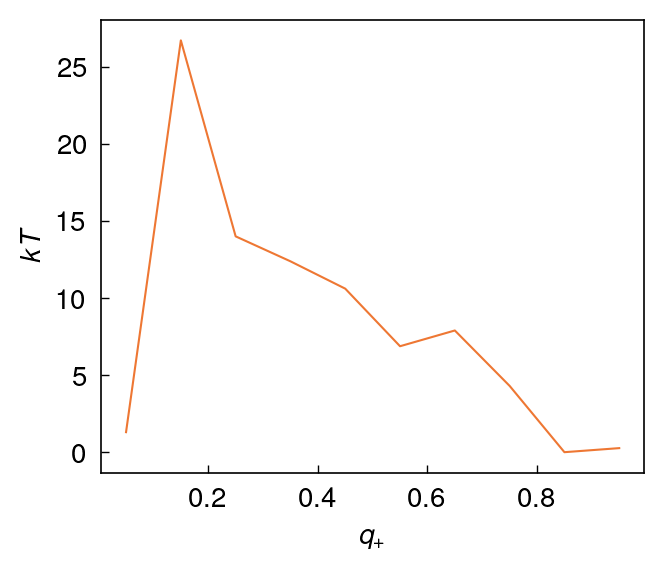

In [40]:
qe = np.linspace(0, 1, 11)
qc = (qe[1:] + qe[:-1]) / 2

w_delay = [t[:-lag] for t in w_nb]
qp_delay = adjust_forward_committor(qp_fs2gs[-1], in_d, lag)
dens = extq.projection.density1d(qp_delay, w_delay, qe)
min_e = np.min(-np.log(dens))
pmf = -np.log(dens) - min_e

fig = plt.figure(figsize=(3.5, 3), dpi=200)
plt.plot(qc, pmf)
plt.xlabel("$q_+$")
plt.ylabel("$kT$")

Text(0, 0.5, '$kT$')

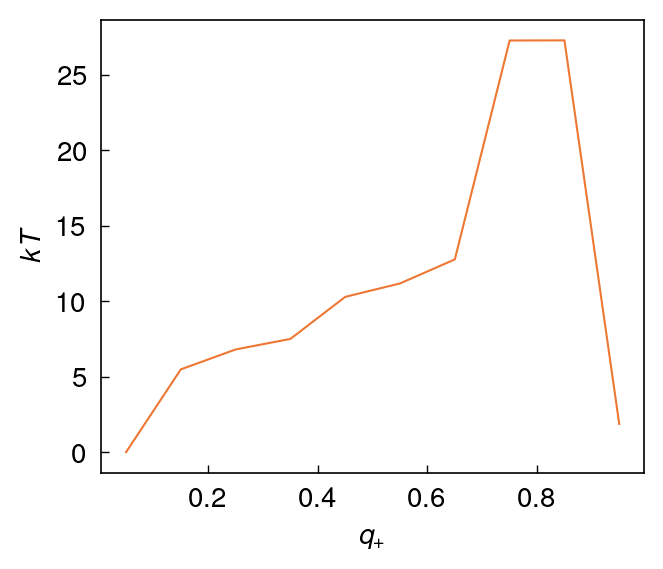

In [41]:
qe = np.linspace(0, 1, 11)
qc = (qe[1:] + qe[:-1]) / 2

w_delay = [t[:-lag] for t in w_nb]
qp_delay = adjust_forward_committor(qp_gs2fs[-1], in_d, lag)
dens = extq.projection.density1d(qp_delay, w_delay, qe)
min_e = np.min(-np.log(dens))
pmf = -np.log(dens) - min_e

fig = plt.figure(figsize=(3.5, 3), dpi=200)
plt.plot(qc, pmf)
plt.xlabel("$q_+$")
plt.ylabel("$kT$")

In [42]:
# save PMFs
pmf_fs2gs, pmf_gs2fs = [], []

In [43]:
w_nb = np.split(reweight(0.87), traj_inds)

pmfs = []
for lag, q in zip(lags, qp_fs2gs):
    w_delay = [t[:-lag] for t in w_nb]
    qp_delay = adjust_forward_committor(q, in_d, lag)
    dens = extq.projection.density1d(qp_delay, w_delay, qe)
    min_e = np.min(-np.log(dens))
    pmfs.append(-np.log(dens) - min_e)
pmf_fs2gs.append(pmfs)

pmfs = []
for lag, q in zip(lags, qp_gs2fs):
    w_delay = [t[:-lag] for t in w_nb]
    qp_delay = adjust_forward_committor(q, in_d, lag)
    dens = extq.projection.density1d(qp_delay, w_delay, qe)
    min_e = np.min(-np.log(dens))
    pmfs.append(-np.log(dens) - min_e)
pmf_gs2fs.append(pmfs)

/scratch/local/jobs/7298669/ipykernel_4075180/2627801926.py:17: RuntimeWarning: divide by zero encountered in log
  min_e = np.min(-np.log(dens))
/scratch/local/jobs/7298669/ipykernel_4075180/2627801926.py:18: RuntimeWarning: divide by zero encountered in log
  pmfs.append(-np.log(dens) - min_e)


## T = 0.89

In [44]:
base_dir89 = "/project/dinner/scguo/kaiB/dga/89/dga_data"

In [45]:
# convert features to IVAC
with open(f"{base_dir89}/ivac.pkl", mode="rb+") as f:
    ivac = dill.load(f)

In [46]:
ivac_trajs = ivac.transform(raw_feats)

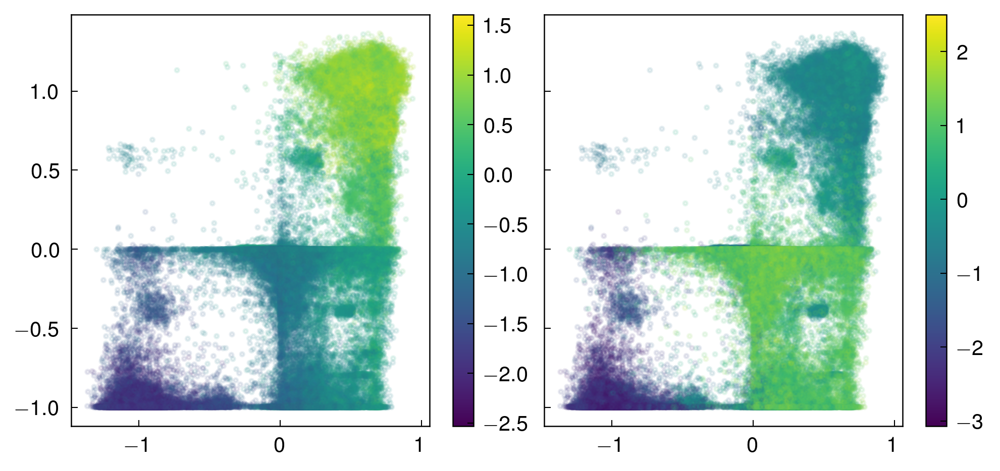

In [85]:
fig, axes = plt.subplots(1, 2, figsize=(6.5, 3), dpi=300, sharex=True, sharey=True, constrained_layout=True)
for i, ax in enumerate(axes):
    sc = ax.scatter(c_green_arr[::50], c_blue_arr[::50], c=np.concatenate(ivac_trajs)[::50, i + 1], alpha=0.1, marker="o")
    cb = plt.colorbar(sc, ax=ax)
    cb.solids.set(alpha=1.)

In [47]:
# assign data to clusters
with open(f"{base_dir89}/nneighbors.pkl", mode="rb+") as f:
    neighbors = dill.load(f)

In [48]:
dtraj = neighbors.kneighbors(np.concatenate(ivac_trajs), return_distance=False)

In [49]:
# split into lists of arrays
k = 300
basis_d_arr = make_sparse_basis(np.squeeze(dtraj), k)[:, :-1]
basis_d_arr[in_fs] = 0
basis_d_arr[in_gs] = 0

traj_lens = [len(traj) for traj in raw_feats]
basis_d = []
curr = 0
for t_len in traj_lens:
    basis_d.append(basis_d_arr[curr : curr + t_len])
    curr += t_len

print(len(basis_d), basis_d[0].shape)

/home/scguo/.local/lib/python3.9/site-packages/scipy/sparse/_index.py:146: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


96 (103322, 299)


In [50]:
coeffs = np.load(f"{base_dir89}/qp_fs2gs_coeffs.npy")
coeffs_gs2fs = np.load(f"{base_dir89}/qp_gs2fs_coeffs.npy")

In [51]:
qp_fs2gs, qp_gs2fs = [], []
for cf, cg in zip(coeffs, coeffs_gs2fs):
    qp_fs2gs.append([x @ cf + g for (x, g) in zip(basis_d, guess_gs)])
    qp_gs2fs.append([x @ cg + g for (x, g) in zip(basis_d, guess_fs)])

/project/dinner/scguo/extq/src/extq/projection.py:140: RuntimeWarning: invalid value encountered in divide
  return numer / denom


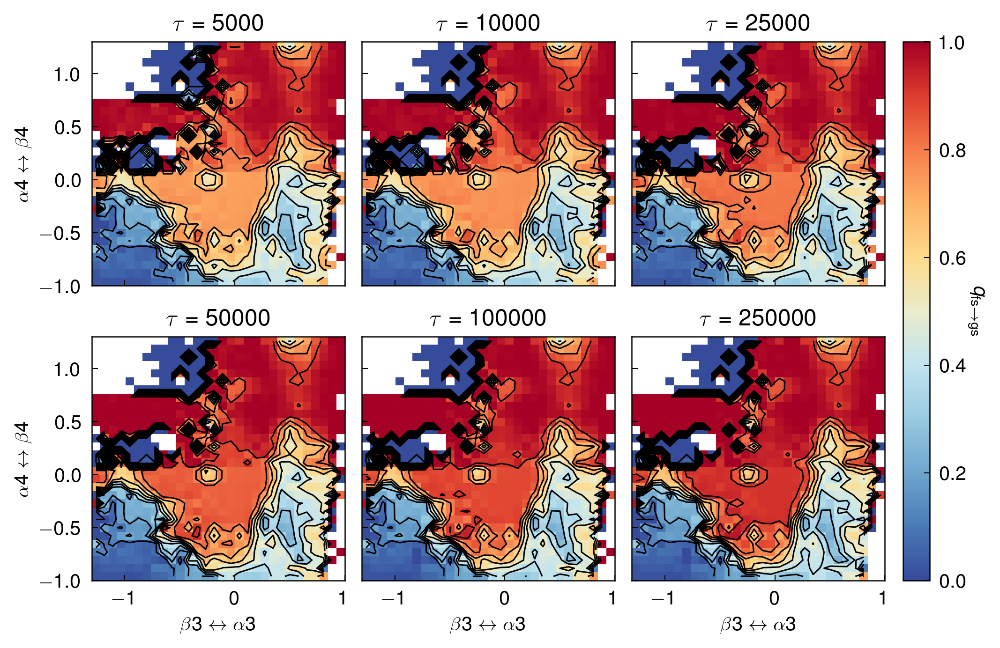

In [52]:
# plot against "GT" and "BT"
fig, axes = plt.subplots(
    nrows=2, ncols=3, figsize=(7, 4.5), dpi=300, sharex=True, sharey=True, constrained_layout=True
)

xe = np.linspace(-1.3, 1, 31)
ye = np.linspace(-1, 1.3, 31)
xc = (xe[1:] + xe[:-1]) / 2
yc = (ye[1:] + ye[:-1]) / 2
clines = np.linspace(0, 1, 11)

w_nb = np.split(reweight(0.89), traj_inds)
for ax, lag, lagtime, q in zip(axes.flat, lags, lagtimes, qp_fs2gs):
    w_delay = [t[:-lag] for t in w_nb]
    cv1_delay = [t[:-lag] for t in c_green]
    cv2_delay = [t[:-lag] for t in c_blue]
    qp_delay = adjust_forward_committor(q, in_d, lag)
    hist = extq.projection.average2d(cv1_delay, cv2_delay, qp_delay, w_delay, xe, ye)
    pc = ax.pcolormesh(xc, yc, hist.T, cmap="diverging")
    ax.contour(xc, yc, hist.T, colors="black", levels=clines)
    ax.set_ylabel(r"$\alpha4\leftrightarrow \beta4$")
    ax.set_xlabel(r"$\beta3\leftrightarrow\alpha3$")
    ax.set_title(f"$\\tau$ = {lagtime}")
    ax.label_outer()
cb = plt.colorbar(pc, ax=axes[:, -1])
cb.set_label(r"$q_{\mathrm{fs}\rightarrow\mathrm{gs}}$", rotation=-90, labelpad=10)

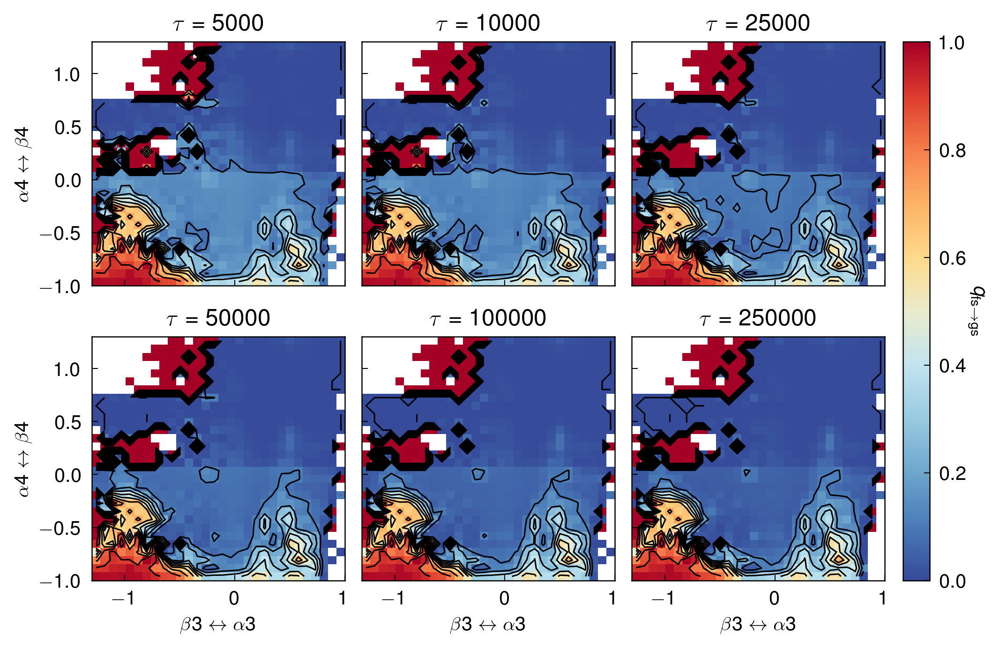

In [53]:
# plot against "GT" and "BT"
fig, axes = plt.subplots(
    nrows=2, ncols=3, figsize=(7, 4.5), dpi=300, sharex=True, sharey=True, constrained_layout=True
)

xe = np.linspace(-1.3, 1, 31)
ye = np.linspace(-1, 1.3, 31)
xc = (xe[1:] + xe[:-1]) / 2
yc = (ye[1:] + ye[:-1]) / 2
clines = np.linspace(0, 1, 11)

w_nb = np.split(reweight(0.83), traj_inds)
for ax, lag, lagtime, q in zip(axes.flat, lags, lagtimes, qp_gs2fs):
    w_delay = [t[:-lag] for t in w_nb]
    cv1_delay = [t[:-lag] for t in c_green]
    cv2_delay = [t[:-lag] for t in c_blue]
    qp_delay = adjust_forward_committor(q, in_d, lag)
    hist = extq.projection.average2d(cv1_delay, cv2_delay, qp_delay, w_delay, xe, ye)
    pc = ax.pcolormesh(xc, yc, hist.T, cmap="diverging")
    ax.contour(xc, yc, hist.T, colors="black", levels=clines)
    ax.set_ylabel(r"$\alpha4\leftrightarrow \beta4$")
    ax.set_xlabel(r"$\beta3\leftrightarrow\alpha3$")
    ax.set_title(f"$\\tau$ = {lagtime}")
    ax.label_outer()
cb = plt.colorbar(pc, ax=axes[:, -1])
cb.set_label(r"$q_{\mathrm{fs}\rightarrow\mathrm{gs}}$", rotation=-90, labelpad=10)

Text(0, 0.5, '$kT$')

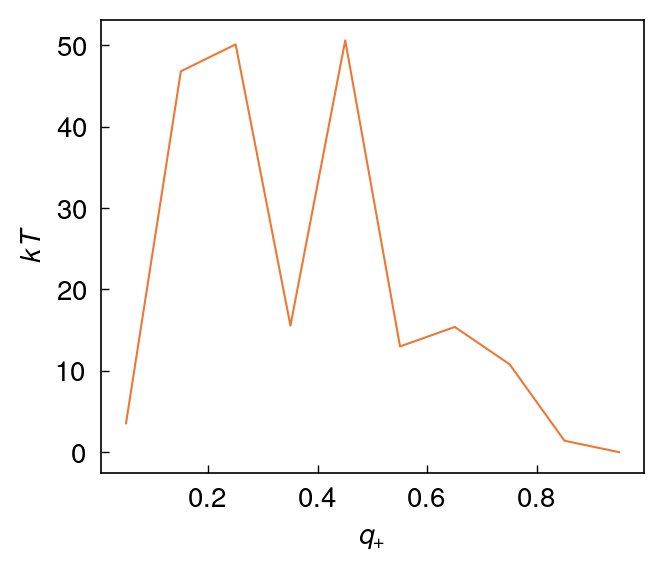

In [54]:
qe = np.linspace(0, 1, 11)
qc = (qe[1:] + qe[:-1]) / 2

w_delay = [t[:-lag] for t in w_nb]
qp_delay = adjust_forward_committor(qp_fs2gs[4], in_d, lag)
dens = extq.projection.density1d(qp_delay, w_delay, qe)
min_e = np.min(-np.log(dens))
pmf = -np.log(dens) - min_e

fig = plt.figure(figsize=(3.5, 3), dpi=200)
plt.plot(qc, pmf)
plt.xlabel("$q_+$")
plt.ylabel("$kT$")

/scratch/local/jobs/7298669/ipykernel_4075180/3175488965.py:7: RuntimeWarning: divide by zero encountered in log
  min_e = np.min(-np.log(dens))
/scratch/local/jobs/7298669/ipykernel_4075180/3175488965.py:8: RuntimeWarning: divide by zero encountered in log
  pmf = -np.log(dens) - min_e


Text(0, 0.5, '$kT$')

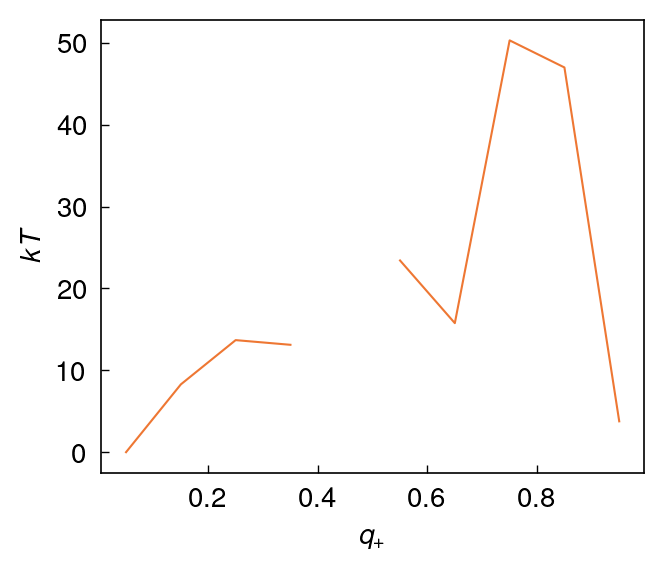

In [55]:
qe = np.linspace(0, 1, 11)
qc = (qe[1:] + qe[:-1]) / 2

w_delay = [t[:-lag] for t in w_nb]
qp_delay = adjust_forward_committor(qp_gs2fs[4], in_d, lag)
dens = extq.projection.density1d(qp_delay, w_delay, qe)
min_e = np.min(-np.log(dens))
pmf = -np.log(dens) - min_e

fig = plt.figure(figsize=(3.5, 3), dpi=200)
plt.plot(qc, pmf)
plt.xlabel("$q_+$")
plt.ylabel("$kT$")

In [57]:
w_nb = np.split(reweight(0.89), traj_inds)

pmfs = []
for lag, q in zip(lags, qp_fs2gs):
    w_delay = [t[:-lag] for t in w_nb]
    qp_delay = adjust_forward_committor(q, in_d, lag)
    dens = extq.projection.density1d(qp_delay, w_delay, qe)
    min_e = np.min(-np.log(dens))
    pmfs.append(-np.log(dens) - min_e)
pmf_fs2gs.append(pmfs)

pmfs = []
for lag, q in zip(lags, qp_gs2fs):
    w_delay = [t[:-lag] for t in w_nb]
    qp_delay = adjust_forward_committor(q, in_d, lag)
    dens = extq.projection.density1d(qp_delay, w_delay, qe)
    min_e = np.min(-np.log(dens))
    pmfs.append(-np.log(dens) - min_e)
pmf_gs2fs.append(pmfs)

/scratch/local/jobs/7298669/ipykernel_4075180/1170199981.py:8: RuntimeWarning: divide by zero encountered in log
  min_e = np.min(-np.log(dens))
/scratch/local/jobs/7298669/ipykernel_4075180/1170199981.py:9: RuntimeWarning: divide by zero encountered in log
  pmfs.append(-np.log(dens) - min_e)
/scratch/local/jobs/7298669/ipykernel_4075180/1170199981.py:17: RuntimeWarning: divide by zero encountered in log
  min_e = np.min(-np.log(dens))
/scratch/local/jobs/7298669/ipykernel_4075180/1170199981.py:18: RuntimeWarning: divide by zero encountered in log
  pmfs.append(-np.log(dens) - min_e)


## T = 0.91

In [58]:
base_dir91 = "/project/dinner/scguo/kaiB/dga/91/dga_data"

In [59]:
# convert features to IVAC
with open(f"{base_dir91}/ivac.pkl", mode="rb+") as f:
    ivac = dill.load(f)

In [60]:
ivac_trajs = ivac.transform(raw_feats)

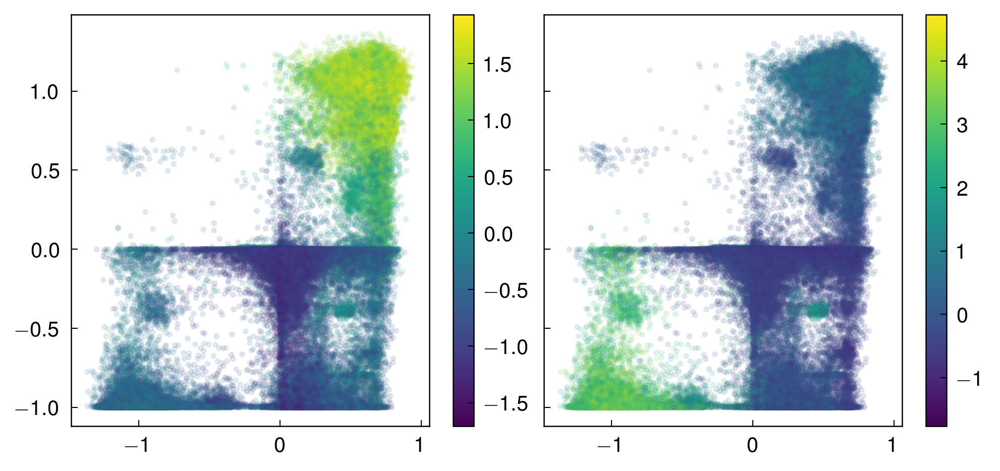

In [98]:
fig, axes = plt.subplots(1, 2, figsize=(6.5, 3), dpi=300, sharex=True, sharey=True, constrained_layout=True)
for i, ax in enumerate(axes):
    sc = ax.scatter(c_green_arr[::50], c_blue_arr[::50], c=np.concatenate(ivac_trajs)[::50, i + 1], alpha=0.1, marker="o")
    cb = plt.colorbar(sc, ax=ax)
    cb.solids.set(alpha=1.)

In [61]:
# assign data to clusters
with open(f"{base_dir91}/nneighbors.pkl", mode="rb+") as f:
    neighbors = dill.load(f)

In [62]:
dtraj = neighbors.kneighbors(np.concatenate(ivac_trajs), return_distance=False)

In [63]:
# split into lists of arrays
k = 300
basis_d_arr = make_sparse_basis(np.squeeze(dtraj), k)[:, :-1]
basis_d_arr[in_fs] = 0
basis_d_arr[in_gs] = 0

traj_lens = [len(traj) for traj in raw_feats]
basis_d = []
curr = 0
for t_len in traj_lens:
    basis_d.append(basis_d_arr[curr : curr + t_len])
    curr += t_len

print(len(basis_d), basis_d[0].shape)

/home/scguo/.local/lib/python3.9/site-packages/scipy/sparse/_index.py:146: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


96 (103322, 299)


In [64]:
coeffs = np.load(f"{base_dir91}/qp_fs2gs_coeffs.npy")
coeffs_gs2fs = np.load(f"{base_dir91}/qp_gs2fs_coeffs.npy")

In [65]:
qp_fs2gs, qp_gs2fs = [], []
for cf, cg in zip(coeffs, coeffs_gs2fs):
    qp_fs2gs.append([x @ cf + g for (x, g) in zip(basis_d, guess_gs)])
    qp_gs2fs.append([x @ cg + g for (x, g) in zip(basis_d, guess_fs)])

In [111]:
pplt.load_cmaps()

/project/dinner/scguo/extq/src/extq/projection.py:140: RuntimeWarning: invalid value encountered in divide
  return numer / denom


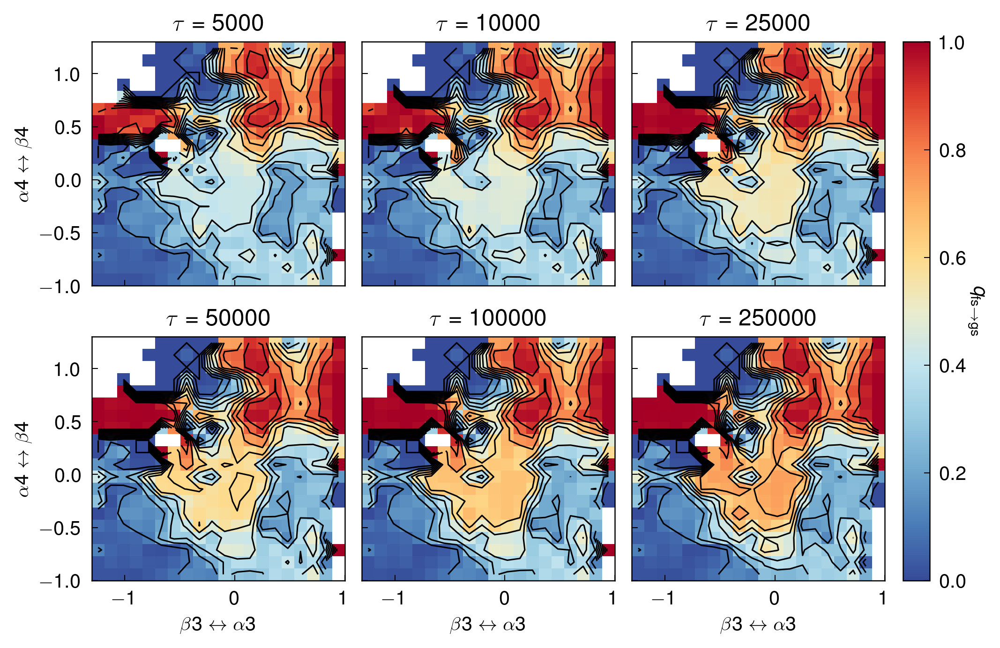

In [66]:
# plot against "GT" and "BT"
fig, axes = plt.subplots(
    nrows=2, ncols=3, figsize=(7, 4.5), dpi=300, sharex=True, sharey=True, constrained_layout=True
)

xe = np.linspace(-1.3, 1, 21)
ye = np.linspace(-1, 1.3, 21)
xc = (xe[1:] + xe[:-1]) / 2
yc = (ye[1:] + ye[:-1]) / 2
clines = np.linspace(0, 1, 11)

w_nb = np.split(reweight(0.91), traj_inds)
for ax, lag, lagtime, q in zip(axes.flat, lags, lagtimes, qp_fs2gs):
    w_delay = [t[:-lag] for t in w_nb]
    cv1_delay = [t[:-lag] for t in c_green]
    cv2_delay = [t[:-lag] for t in c_blue]
    qp_delay = adjust_forward_committor(q, in_d, lag)
    hist = extq.projection.average2d(cv1_delay, cv2_delay, qp_delay, w_delay, xe, ye)
    pc = ax.pcolormesh(xc, yc, hist.T, cmap="diverging")
    ax.contour(xc, yc, hist.T, colors="black", levels=clines)
    ax.set_ylabel(r"$\alpha4\leftrightarrow \beta4$")
    ax.set_xlabel(r"$\beta3\leftrightarrow\alpha3$")
    ax.set_title(f"$\\tau$ = {lagtime}")
    ax.label_outer()
cb = plt.colorbar(pc, ax=axes[:, -1])
cb.set_label(r"$q_{\mathrm{fs}\rightarrow\mathrm{gs}}$", rotation=-90, labelpad=10)

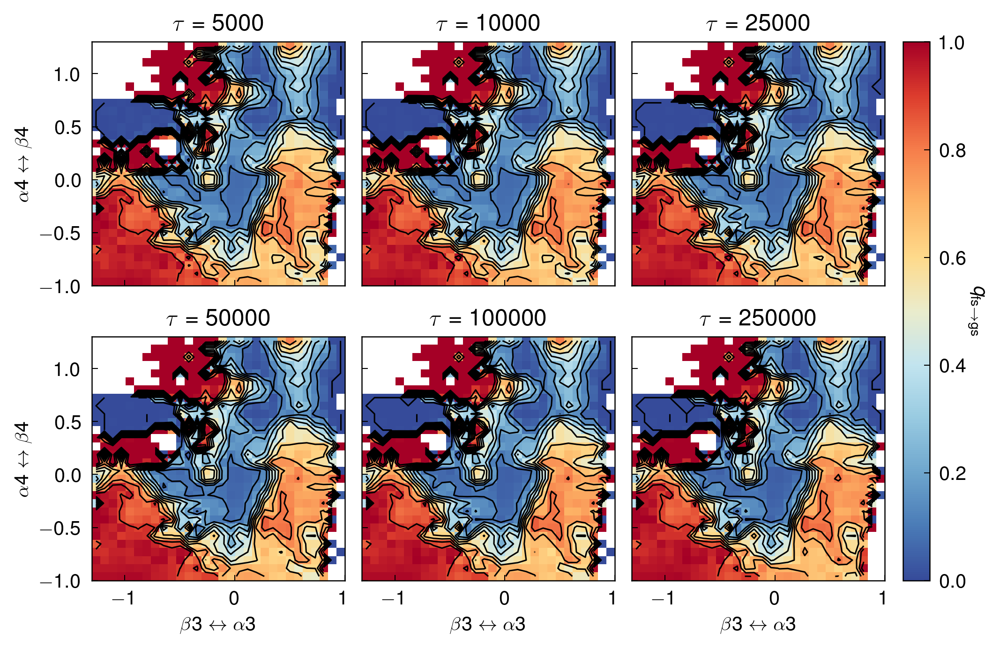

In [67]:
# plot against "GT" and "BT"
fig, axes = plt.subplots(
    nrows=2, ncols=3, figsize=(7, 4.5), dpi=300, sharex=True, sharey=True, constrained_layout=True
)

xe = np.linspace(-1.3, 1, 31)
ye = np.linspace(-1, 1.3, 31)
xc = (xe[1:] + xe[:-1]) / 2
yc = (ye[1:] + ye[:-1]) / 2
clines = np.linspace(0, 1, 11)

w_nb = np.split(reweight(0.91), traj_inds)
for ax, lag, lagtime, q in zip(axes.flat, lags, lagtimes, qp_gs2fs):
    w_delay = [t[:-lag] for t in w_nb]
    cv1_delay = [t[:-lag] for t in c_green]
    cv2_delay = [t[:-lag] for t in c_blue]
    qp_delay = adjust_forward_committor(q, in_d, lag)
    hist = extq.projection.average2d(cv1_delay, cv2_delay, qp_delay, w_delay, xe, ye)
    pc = ax.pcolormesh(xc, yc, hist.T, cmap="diverging")
    ax.contour(xc, yc, hist.T, colors="black", levels=clines)
    ax.set_ylabel(r"$\alpha4\leftrightarrow \beta4$")
    ax.set_xlabel(r"$\beta3\leftrightarrow\alpha3$")
    ax.set_title(f"$\\tau$ = {lagtime}")
    ax.label_outer()
cb = plt.colorbar(pc, ax=axes[:, -1])
cb.set_label(r"$q_{\mathrm{fs}\rightarrow\mathrm{gs}}$", rotation=-90, labelpad=10)

/scratch/local/jobs/7298669/ipykernel_4075180/2642353206.py:7: RuntimeWarning: divide by zero encountered in log
  min_e = np.min(-np.log(dens))
/scratch/local/jobs/7298669/ipykernel_4075180/2642353206.py:8: RuntimeWarning: divide by zero encountered in log
  pmf = -np.log(dens) - min_e


Text(0, 0.5, '$kT$')

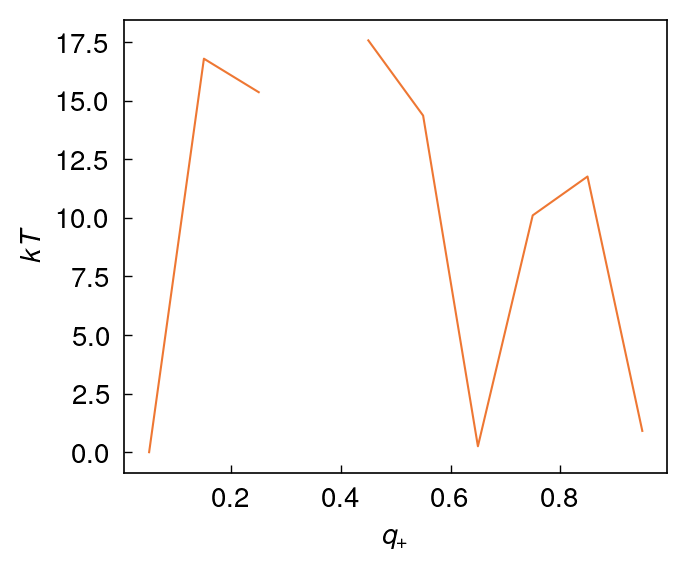

In [68]:
qe = np.linspace(0, 1, 11)
qc = (qe[1:] + qe[:-1]) / 2

w_delay = [t[:-lag] for t in w_nb]
qp_delay = adjust_forward_committor(qp_fs2gs[4], in_d, lag)
dens = extq.projection.density1d(qp_delay, w_delay, qe)
min_e = np.min(-np.log(dens))
pmf = -np.log(dens) - min_e

fig = plt.figure(figsize=(3.5, 3), dpi=200)
plt.plot(qc, pmf)
plt.xlabel("$q_+$")
plt.ylabel("$kT$")

/scratch/local/jobs/7298669/ipykernel_4075180/3175488965.py:7: RuntimeWarning: divide by zero encountered in log
  min_e = np.min(-np.log(dens))
/scratch/local/jobs/7298669/ipykernel_4075180/3175488965.py:8: RuntimeWarning: divide by zero encountered in log
  pmf = -np.log(dens) - min_e


Text(0, 0.5, '$kT$')

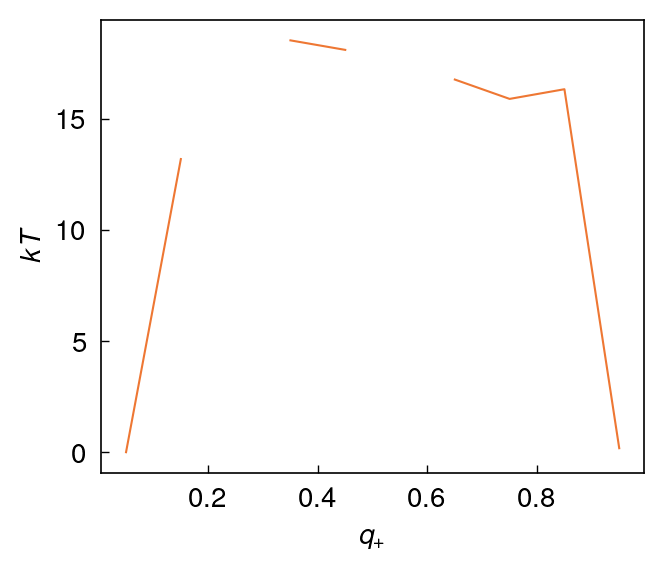

In [69]:
qe = np.linspace(0, 1, 11)
qc = (qe[1:] + qe[:-1]) / 2

w_delay = [t[:-lag] for t in w_nb]
qp_delay = adjust_forward_committor(qp_gs2fs[4], in_d, lag)
dens = extq.projection.density1d(qp_delay, w_delay, qe)
min_e = np.min(-np.log(dens))
pmf = -np.log(dens) - min_e

fig = plt.figure(figsize=(3.5, 3), dpi=200)
plt.plot(qc, pmf)
plt.xlabel("$q_+$")
plt.ylabel("$kT$")

In [70]:
w_nb = np.split(reweight(0.91), traj_inds)

pmfs = []
for lag, q in zip(lags, qp_fs2gs):
    w_delay = [t[:-lag] for t in w_nb]
    qp_delay = adjust_forward_committor(q, in_d, lag)
    dens = extq.projection.density1d(qp_delay, w_delay, qe)
    min_e = np.min(-np.log(dens))
    pmfs.append(-np.log(dens) - min_e)
pmf_fs2gs.append(pmfs)

pmfs = []
for lag, q in zip(lags, qp_gs2fs):
    w_delay = [t[:-lag] for t in w_nb]
    qp_delay = adjust_forward_committor(q, in_d, lag)
    dens = extq.projection.density1d(qp_delay, w_delay, qe)
    min_e = np.min(-np.log(dens))
    pmfs.append(-np.log(dens) - min_e)
pmf_gs2fs.append(pmfs)

/scratch/local/jobs/7298669/ipykernel_4075180/3361026467.py:8: RuntimeWarning: divide by zero encountered in log
  min_e = np.min(-np.log(dens))
/scratch/local/jobs/7298669/ipykernel_4075180/3361026467.py:9: RuntimeWarning: divide by zero encountered in log
  pmfs.append(-np.log(dens) - min_e)
/scratch/local/jobs/7298669/ipykernel_4075180/3361026467.py:17: RuntimeWarning: divide by zero encountered in log
  min_e = np.min(-np.log(dens))
/scratch/local/jobs/7298669/ipykernel_4075180/3361026467.py:18: RuntimeWarning: divide by zero encountered in log
  pmfs.append(-np.log(dens) - min_e)


## Plot Transition state barriers for different $T$'s and committors

In [73]:
len(pmf_fs2gs)

4

In [80]:
len(pmf_gs2fs)

4

In [81]:
del pmf_fs2gs[1]
del pmf_gs2fs[1]

In [99]:
pmf_fs2gs[1]

[array([ 0.71906275, 13.0336207 , 18.7000588 ,         inf, 18.43118671,
         9.06878331,  5.81615382,  0.        ,  7.45554355,  0.70097537]),
 array([ 0.70492058, 13.45289046, 19.65513672,         inf, 19.3696317 ,
        11.55984335,  7.08356979,  0.        ,  7.82017942,  0.65757006]),
 array([ 0.62286908, 20.4866033 , 13.75453318, 20.61792643,         inf,
        11.27571601,  9.17139163,  0.        ,  2.82526325,  0.53874944]),
 array([ 0.65600687, 20.05953046, 13.64190035, 21.26967344, 26.76069417,
        12.33458847, 11.91069231,  6.2669163 ,  0.        ,  0.54706407]),
 array([ 0.63866487, 20.32501203, 22.64722419, 13.48135181, 22.404802  ,
        11.98912123, 13.59872776,  9.35728072,  0.        ,  0.50784918]),
 array([ 1.06786192, 24.48853944, 22.60882277, 14.78769187, 14.80233249,
        13.7952781 , 12.41195282, 13.13627221,  4.03495577,  0.        ])]

In [98]:
np.max(pmf_fs2gs[1][0][pmf_fs2gs[1][0] != np.inf])

18.70005880464919

In [93]:
pmf_fs2gs[1][pmf_fs2gs[1] != np.inf]

array([ 0.70492058, 13.45289046, 19.65513672,         inf, 19.3696317 ,
       11.55984335,  7.08356979,  0.        ,  7.82017942,  0.65757006])

In [85]:
np.nanmax(pmf_fs2gs[1][pmf_fs2gs[1] != np.inf], axis=-1)

inf

In [100]:
barriers_fs2gs = np.zeros((3, len(lags)))
barriers_gs2fs = np.zeros((3, len(lags)))

for t, pmfs_t in enumerate(pmf_fs2gs):
    for i, (lag, pmf) in enumerate(zip(lags, pmfs_t)):
        barriers_fs2gs[t, i] = np.max(pmf[pmf != np.inf])
for t, pmfs_t in enumerate(pmf_gs2fs):
    for i, (lag, pmf) in enumerate(zip(lags, pmfs_t)):
        barriers_gs2fs[t, i] = np.max(pmf[pmf != np.inf])

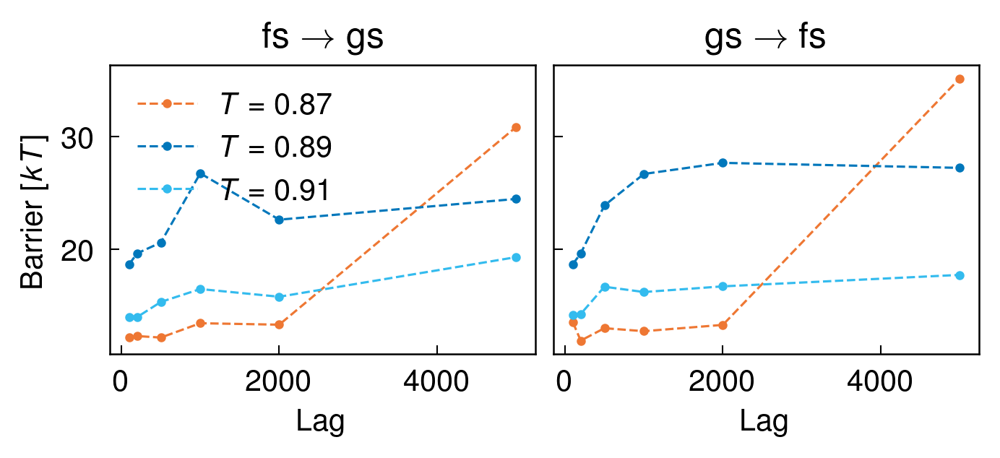

In [104]:
fig, axes = plt.subplots(ncols=2, figsize=(4.5, 2), dpi=300, sharex=True, sharey=True, constrained_layout=True)

temps = [0.87, 0.89, 0.91]
for i, t in enumerate(temps):
    axes[0].plot(lags, barriers_fs2gs[i],  "o--", label=f"$T = {t}$")
    axes[1].plot(lags, barriers_gs2fs[i], "o--")
for ax in axes:
    ax.set_xlabel("Lag")
    ax.set_ylabel(r"Barrier [$kT$]")
    ax.label_outer()
axes[0].set_title(r"$\mathrm{fs}\rightarrow\mathrm{gs}$")
axes[1].set_title(r"$\mathrm{gs}\rightarrow\mathrm{fs}$")
axes[0].legend()

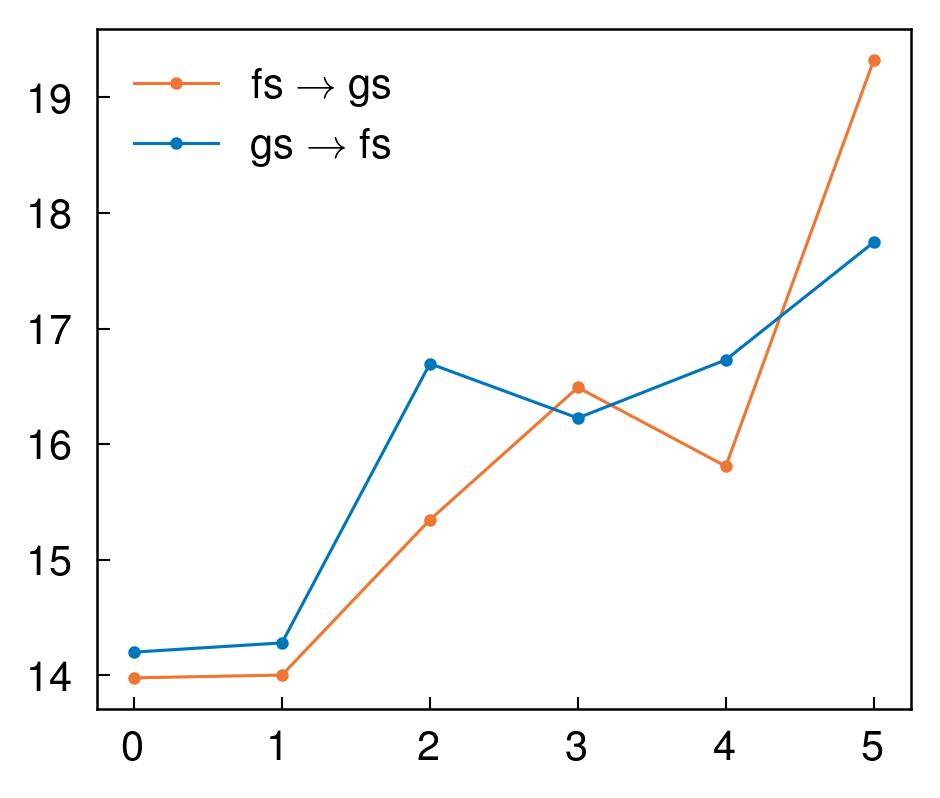

In [105]:
fig = plt.figure(figsize=(3.5, 3), dpi=300)
plt.plot(barriers_fs2gs[-1, :], "-o")
plt.plot(barriers_gs2fs[-1, :], "-o")
plt.legend([r"$\mathrm{fs}\rightarrow\mathrm{gs}$", r"$\mathrm{gs}\rightarrow\mathrm{fs}$"])